1. **PROBLEM STATEMENT**

Netflix is an American subscription video on-demand over-the-top streaming service. The service primarily distributes original and acquired films and television shows from various genres, and it is available internationally in multiple languages.
Netflix is available in every country and territory except for China, North Korea, Syria and Russia.

This project aims to obtain netflix data and then obtain various clusters of similar movies and TV shows, making it easier to recommend a user about movies and tv shows that are tailor made for his/her liking.
For instance, Netflix decided to create its own original TV show after understanding that most of the Netflix users from its database searched the keywords-'political','thriller','Washington','Kevin Spacey'. So Netflix hired director David Fincher to create a TV show called 'House of Cards' as an American political thriller television series created alongside Beau Willimon.  The first 13-episode season was released on February 1, 2013, on the streaming service Netflix. House of Cards is the first TV series to have been produced by a studio for Netflix.

Efficient clustering and recommendation systems allows Netflix to manage its large database efficiently so that Netflix can attract new customers and at the same time retain its existing customer base for continued longevity of the enterprise and ensure the company can run in a healthy manner, so as to withstand competition within a competitive streaming environment.

### **GITHUB LINK**

https://gist.github.com/hussain-suhail-94/ab7d92d83bc9b4e1346b00a39126e049

2. Know Your Data:

  Importing the libraries

In [ ]:
import numpy as np
import pandas as pd
from numpy import math
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib.pyplot import figure
import plotly.graph_objects as go
import plotly.offline as py
import plotly.express as px
from datetime import datetime

import warnings
warnings.filterwarnings('ignore')

import os
py.offline.init_notebook_mode(connected = True)

<ipython-input-1-2594c9f3139e>:3: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  from numpy import math


Import the dataset

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

Dataset Firstview

In [ ]:
df.head()
# Viewing the top 5 rows

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
# Viewing the last 5 rows
df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


Dataset Rows & Columns Count

In [ ]:
df.shape

(7787, 12)

number of rows : 7787  
number of columns : 12

Dataset Information

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


Clearly, following columns contain missing values:
director,cast,country,date_added,rating. There are 7787 rows and 12 columns in the dataset.The dataset does not contain any duplicate values.

 Most machine-learning algorithms do not support missing values, missing data must be handled during the dataset's pre-processing. So we look for values that are missing.

In [ ]:
print(df.isnull().sum())

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


Understanding the Variables

so, from the above output we get to know the exact number of null values in the dataset.

Understanding the variables:

Columns

In [ ]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

Statistical summary of numerical columns

In [ ]:
df.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


Variables Description:

1.show_id : Unique ID for every Movie/Show

2.type : Identifier - Movie/Show

3.title : Title of the Movie/Show

4.director : Director of the Movie/Show

5.cast : Actors involved in the Movie/Show

6.country : Country where the Movie/Show was produced

7.date_added : Date it was added on Netflix

8.release_year : Actual Release year of the Movie/Show

9.rating : TV Rating of the Movie/Show

10.duration : Total Duration - in minutes or number of seasons

11.listed_in : Genre

12.description : The Summary description






Unique Values

In [ ]:
df.nunique()

,0
show_id,7787
type,2
title,7787
director,4049
cast,6831
country,681
date_added,1565
release_year,73
rating,14
duration,216


The above data shows the no. of unique values in each variable.
There are 7787 different titles, 681 countries, 6831 cast members, 492 different genre(listed_in) and so on.

**DATA WRANGLING:**

Data wrangling is the process of transforming raw data into a more usable format.

It ensures that data is reliable and complete before it's used for analysis

In [ ]:
df.country.value_counts()
#count of countries

,count
country,
United States,2555
India,923
United Kingdom,397
Japan,226
South Korea,183
...,...
"Russia, United States, China",1
"Italy, Switzerland, France, Germany",1
"United States, United Kingdom, Canada",1


In [ ]:
# Genre of shows
df.listed_in.value_counts()

,count
listed_in,
Documentaries,334
Stand-Up Comedy,321
"Dramas, International Movies",320
"Comedies, Dramas, International Movies",243
"Dramas, Independent Movies, International Movies",215
...,...
"Crime TV Shows, Romantic TV Shows, Spanish-Language TV Shows",1
"Crime TV Shows, International TV Shows, Reality TV",1
"International Movies, Romantic Movies, Sci-Fi & Fantasy",1


There are some movies / TV shows that were filmed in multiple countries, have multiple genres associated with it.

To simplify the analysis, let's consider only the primary country where that respective movie / TV show was filmed.

Also, let's consider only the primary genre of the respective movie / TV show.

In [ ]:
df['country'] = df['country'].astype(str).apply(lambda x: x.split(',')[0] if ',' in x else x)
df['listed_in'] = df['listed_in'].astype(str).apply(lambda x: x.split(',')[0] if ',' in x else x)

In [ ]:
# country in which a movie was produced
df.country.value_counts()

,count
country,
United States,2883
India,956
United Kingdom,577
nan,507
Canada,259
...,...
Zimbabwe,1
Namibia,1
Soviet Union,1


Clearly, we see increase in the count of US, INDIA, UK when we consider them as the primary countries.

**Typecasting 'duration' from string to integer**:

In [ ]:
# Splitting the duration column, and changing the datatype to integer
df['duration'] = df['duration'].apply(lambda x: int(x.split()[0]))

In [ ]:
# Number of seasons for tv shows
df[df['type']=='TV Show'].duration.value_counts()

,count
duration,
1,1606
2,378
3,183
4,86
5,57
6,30
7,19
8,18
9,8


In [ ]:
# Movie length in minutes
df[df['type']=='Movie'].duration.unique()

array([ 93,  78,  80, 123,  95, 119, 118, 143, 103,  89,  91, 149, 144,
       124,  87, 110, 128, 117, 100,  84,  99,  90, 102, 104, 105,  56,
       125,  81,  97, 106, 107, 109,  44,  75, 101, 113, 114, 130,  94,
       140, 135,  82,  70, 121,  92, 164,  53,  83, 116,  86, 120,  96,
       126, 129,  77, 137, 148,  28, 122, 176,  85,  22,  68, 111,  29,
       142, 168,  21,  59,  20,  98, 108,  76,  26, 156,  30,  57, 150,
       133, 115, 154, 127, 146, 136,  88, 131,  24, 112,  74,  63,  38,
        25, 174,  60, 153, 158, 151, 162,  54,  51,  69,  64, 147,  42,
        79,  40,  45, 172,  10, 163,  55,  72,  61,  71, 160, 171,  48,
       139, 157,  15,  65, 134, 161,  62, 186,  49,  73,  58, 165, 166,
       138, 159, 141, 132,  52,  67,  34,  66, 312, 180,  47, 155,  14,
       177,  11,   9,  46, 145,   8,  12,  43,  50,  23, 185, 200, 169,
        27, 170, 196,  33, 181, 204,  32,  35, 167, 179, 193,  13, 214,
        17, 173, 192, 209, 187,  41, 182, 224,  37, 233, 189, 15

In [ ]:
# datatype of duration
df.duration.dtype

dtype('int64')

We have successfully converted the datatype of duration column to int.

**Typecasting 'date_added' from string to datetime:**

In [ ]:
# Typecasting 'date_added' from string to datetime
# Applying strip to remove leading/trailing whitespaces from the date strings
df["date_added"] = pd.to_datetime(df['date_added'].str.strip(), format='%B %d, %Y', errors='coerce')

In [ ]:
# first and last date on which a show was added on Netflix
df.date_added.min(),df.date_added.max()

(Timestamp('2008-01-01 00:00:00'), Timestamp('2021-01-16 00:00:00'))

The shows were added on Netflix between 1st January 2008 and 16th January 2021

In [ ]:
# Adding new attributes month and year of date added

df['month_added'] = df['date_added'].dt.month
df['year_added'] = df['date_added'].dt.year
df.drop('date_added', axis=1, inplace=True)

Exploratory Data Analysis(EDA):

EDA involves analyzing and visualizing data to understand its key characteristics, uncover patterns, and identify relationships between variables refers to the method of studying and exploring record sets to apprehend their predominant traits, discover patterns, locate outliers, and identify relationships between variables.

Where possible, I'll use the Netflix brand colours.

https://brand.netflix.com/en/assets/brand-symbol/  
Using the brand palette looks professional, and keeps the reader engaged.

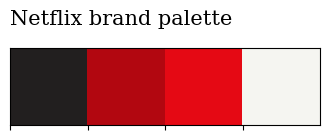

In [ ]:
# Palette
sns.palplot(['#221f1f', '#b20710', '#e50914','#f5f5f1'])

plt.title("Netflix brand palette ",loc='left',fontfamily='serif',fontsize=15,y=1.2)
plt.show()

Let's look at the ratio of movies and tv shows in Netflix.

In [ ]:
# For viz: Ratio of Movies & TV shows

x=df.groupby(['type'])['type'].count()
y=len(df)
r=((x/y)).round(2)

mf_ratio = pd.DataFrame(r).T

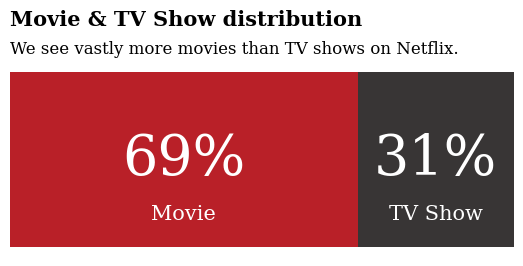

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(6.5, 2.5))

ax.barh(mf_ratio.index, mf_ratio['Movie'],
        color='#b20710', alpha=0.9, label='Male')
ax.barh(mf_ratio.index, mf_ratio['TV Show'], left=mf_ratio['Movie'],
        color='#221f1f', alpha=0.9, label='Female')

ax.set_xlim(0, 1)
ax.set_xticks([])
ax.set_yticks([])
#ax.set_yticklabels(mf_ratio.index, fontfamily='serif', fontsize=11)


# movie percentage
for i in mf_ratio.index:
    ax.annotate(f"{int(mf_ratio['Movie'][i]*100)}%",
                   xy=(mf_ratio['Movie'][i]/2, i),
                   va = 'center', ha='center',fontsize=40, fontweight='light', fontfamily='serif',
                   color='white')

    ax.annotate("Movie",
                   xy=(mf_ratio['Movie'][i]/2, -0.25),
                   va = 'center', ha='center',fontsize=15, fontweight='light', fontfamily='serif',
                   color='white')


for i in mf_ratio.index:
    ax.annotate(f"{int(mf_ratio['TV Show'][i]*100)}%",
                   xy=(mf_ratio['Movie'][i]+mf_ratio['TV Show'][i]/2, i),
                   va = 'center', ha='center',fontsize=40, fontweight='light', fontfamily='serif',
                   color='white')
    ax.annotate("TV Show",
                   xy=(mf_ratio['Movie'][i]+mf_ratio['TV Show'][i]/2, -0.25),
                   va = 'center', ha='center',fontsize=15, fontweight='light', fontfamily='serif',
                   color='white')






# Title & Subtitle
fig.text(0.125,1.03,'Movie & TV Show distribution', fontfamily='serif',fontsize=15, fontweight='bold')
fig.text(0.125,0.92,'We see vastly more movies than TV shows on Netflix.',fontfamily='serif',fontsize=12)

for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)



#ax.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.06))

# Removing legend due to labelled plot
ax.legend().set_visible(False)
plt.show()

So we now know there are much more movies than TV shows on Netflix.

Let's look at top 10 directors by content production:

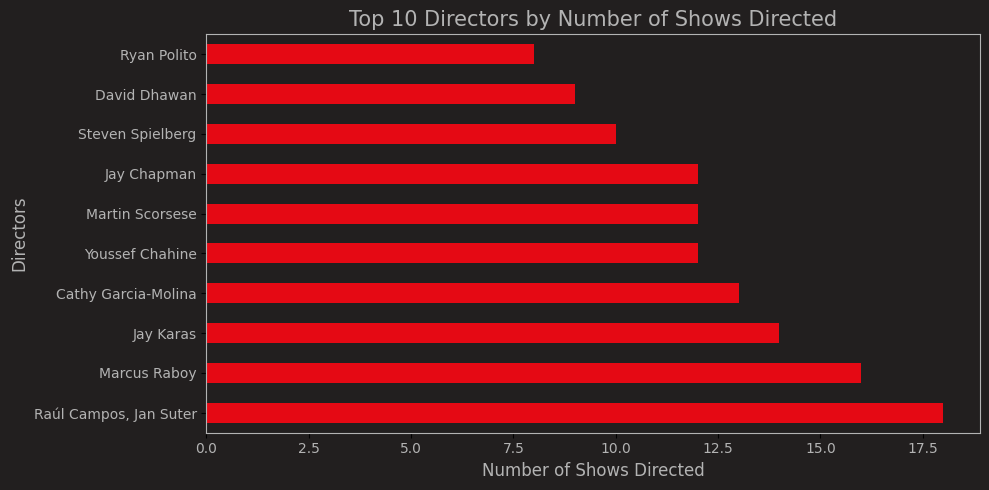

In [ ]:
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Plotting
plt.figure(figsize=(10, 5), facecolor=netflix_gray)

df[~(df['director'] == 'Unknown')].director.value_counts().nlargest(10).plot(
    kind='barh',
    color=netflix_red
)

# Title and aesthetics
plt.title('Top 10 Directors by Number of Shows Directed', fontsize=15, color=netflix_light_gray)
plt.xlabel('Number of Shows Directed', fontsize=12, color=netflix_light_gray)
plt.ylabel('Directors', fontsize=12, color=netflix_light_gray)
plt.xticks(color=netflix_light_gray)
plt.yticks(color=netflix_light_gray)
plt.gca().set_facecolor(netflix_gray)
plt.gca().spines['top'].set_color(netflix_light_gray)
plt.gca().spines['bottom'].set_color(netflix_light_gray)
plt.gca().spines['left'].set_color(netflix_light_gray)
plt.gca().spines['right'].set_color(netflix_light_gray)

plt.tight_layout()
plt.show()


But what if we want separate data on the top directors of movie and tv shows separately?

In [ ]:
print(f"Number of Movies directed by directors are: {df[df['type'] == 'Movie']['director'].value_counts().sum()}")
print(f"Number of TV shows directed by directors are: {df[df['type'] == 'TV Show']['director'].value_counts().sum()}")


Number of Movies directed by directors are: 5214
Number of TV shows directed by directors are: 184


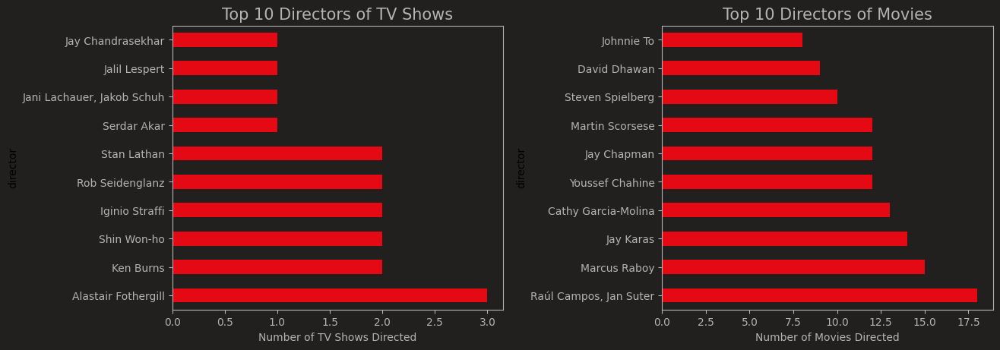

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(14, 5), facecolor="#221F1F")  # Set figure background to Netflix Gray

# Top 10 directors who directed TV shows
tv_shows = df[df['type'] == 'TV Show']['director'].value_counts()[:10].plot(
    kind='barh', ax=ax[0], color="#E50914"
)
tv_shows.set_title('Top 10 Directors of TV Shows', size=15, color="#B3B3B3")
tv_shows.set_xlabel('Number of TV Shows Directed', color="#B3B3B3")
tv_shows.set_facecolor("#221F1F")  # Axes background to Netflix Gray
tv_shows.tick_params(colors="#B3B3B3")
tv_shows.spines['top'].set_color("#B3B3B3")
tv_shows.spines['bottom'].set_color("#B3B3B3")
tv_shows.spines['left'].set_color("#B3B3B3")
tv_shows.spines['right'].set_color("#B3B3B3")

# Top 10 directors who directed Movies
movies = df[df['type'] == 'Movie']['director'].value_counts()[:10].plot(
    kind='barh', ax=ax[1], color="#E50914"
)
movies.set_title('Top 10 Directors of Movies', size=15, color="#B3B3B3")
movies.set_xlabel('Number of Movies Directed', color="#B3B3B3")
movies.set_facecolor("#221F1F")  # Axes background to Netflix Gray
movies.tick_params(colors="#B3B3B3")
movies.spines['top'].set_color("#B3B3B3")
movies.spines['bottom'].set_color("#B3B3B3")
movies.spines['left'].set_color("#B3B3B3")
movies.spines['right'].set_color("#B3B3B3")

# Adjust layout and aesthetics
plt.tight_layout(pad=1.2, rect=[0, 0, 0.95, 0.95])
plt.show()


Observations:

The three shows directed by Alastair Fothergill are the highest on the data list.
Both, Jan Suter and Raul Campos have directed 18 films, more than anyone else in the dataset.

What about if we look at content by country?

In [ ]:
# Quick feature engineering

# Helper column for various plots
df['count'] = 1

# Many productions have several countries listed - this will skew our results, we'll grab the first one mentioned

# Lets retrieve just the first country
# Handle potential missing or invalid data in the 'country' column
df['first_country'] = df['country'].apply(lambda x: x.split(",")[0] if isinstance(x, str) else None)
df['first_country'].head()


ratings_ages = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

df['target_ages'] = df['rating'].replace(ratings_ages)
df['target_ages'].unique()

# Genre

df['genre'] = df['listed_in'].apply(lambda x :  x.replace(' ,',',').replace(', ',',').split(','))

# Reducing name length

df['first_country'].replace('United States', 'USA', inplace=True)
df['first_country'].replace('United Kingdom', 'UK',inplace=True)
df['first_country'].replace('South Korea', 'S. Korea',inplace=True)

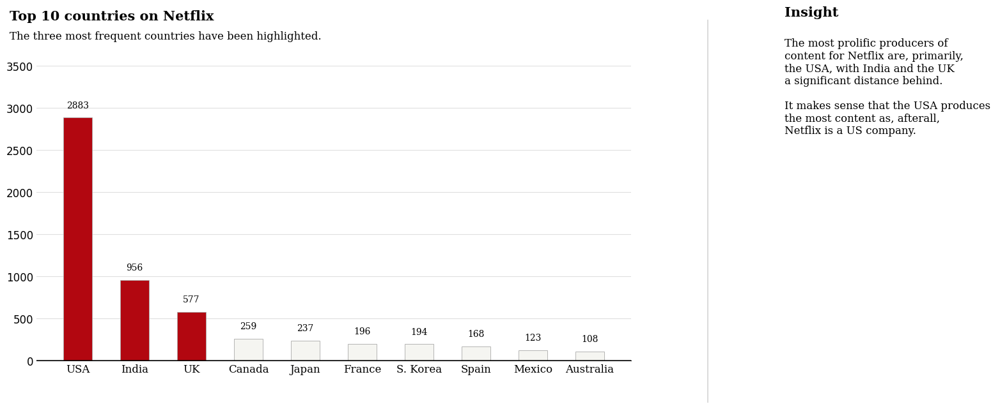

In [ ]:
data = df.groupby('first_country')['count'].sum().sort_values(ascending=False)[:10]

# Plot

color_map = ['#f5f5f1' for _ in range(10)]
color_map[0] = color_map[1] = color_map[2] =  '#b20710' # color highlight

fig, ax = plt.subplots(1,1, figsize=(12, 6))
ax.bar(data.index, data, width=0.5,
       edgecolor='darkgray',
       linewidth=0.6,color=color_map)

#annotations
for i in data.index:
    ax.annotate(f"{data[i]}",
                   xy=(i, data[i] + 150), #i like to change this to roughly 5% of the highest cat
                   va = 'center', ha='center',fontweight='light', fontfamily='serif')



# Remove border from plot

for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)

# Tick labels

ax.set_xticklabels(data.index, fontfamily='serif', rotation=0)

# Title and sub-title

fig.text(0.09, 1, 'Top 10 countries on Netflix', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(0.09, 0.95, 'The three most frequent countries have been highlighted.', fontsize=12, fontweight='light', fontfamily='serif')

fig.text(1.1, 1.01, 'Insight', fontsize=15, fontweight='bold', fontfamily='serif')

fig.text(1.1, 0.67, '''
The most prolific producers of
content for Netflix are, primarily,
the USA, with India and the UK
a significant distance behind.

It makes sense that the USA produces
the most content as, afterall,
Netflix is a US company.
'''
         , fontsize=12, fontweight='light', fontfamily='serif')

ax.grid(axis='y', linestyle='-', alpha=0.4)

grid_y_ticks = np.arange(0, 4000, 500) # y ticks, min, max, then step
ax.set_yticks(grid_y_ticks)
ax.set_axisbelow(True)

#Axis labels

#plt.xlabel("Country", fontsize=12, fontweight='light', fontfamily='serif',loc='left',y=-1.5)
#plt.ylabel("Count", fontsize=12, fontweight='light', fontfamily='serif')
 #plt.legend(loc='upper right')

# thicken the bottom line if you want to
plt.axhline(y = 0, color = 'black', linewidth = 1.3, alpha = .7)

ax.tick_params(axis='both', which='major', labelsize=12)


import matplotlib.lines as lines
l1 = lines.Line2D([1, 1], [0, 1], transform=fig.transFigure, figure=fig,color='black',lw=0.2)
fig.lines.extend([l1])

ax.tick_params(axis=u'both', which=u'both',length=0)

plt.show()

How does content by country vary?

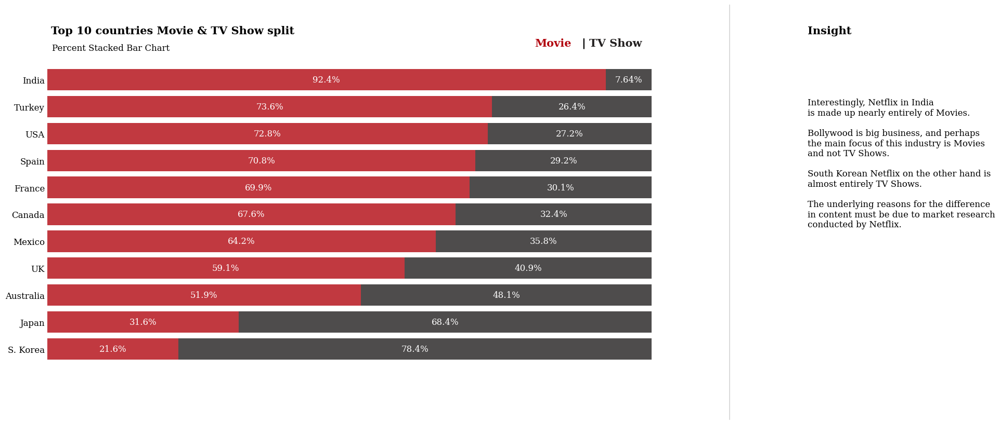

In [ ]:
country_order = df['first_country'].value_counts()[:11].index
data_q2q3 = df[['type', 'first_country']].groupby('first_country')['type'].value_counts().unstack().loc[country_order]
data_q2q3['sum'] = data_q2q3.sum(axis=1)
data_q2q3_ratio = (data_q2q3.T / data_q2q3['sum']).T[['Movie', 'TV Show']].sort_values(by='Movie',ascending=False)[::-1]




###
fig, ax = plt.subplots(1,1,figsize=(15, 8),)

ax.barh(data_q2q3_ratio.index, data_q2q3_ratio['Movie'],
        color='#b20710', alpha=0.8, label='Movie')
ax.barh(data_q2q3_ratio.index, data_q2q3_ratio['TV Show'], left=data_q2q3_ratio['Movie'],
        color='#221f1f', alpha=0.8, label='TV Show')


ax.set_xlim(0, 1)
ax.set_xticks([])
ax.set_yticklabels(data_q2q3_ratio.index, fontfamily='serif', fontsize=11)

# male percentage
for i in data_q2q3_ratio.index:
    ax.annotate(f"{data_q2q3_ratio['Movie'][i]*100:.3}%",
                   xy=(data_q2q3_ratio['Movie'][i]/2, i),
                   va = 'center', ha='center',fontsize=12, fontweight='light', fontfamily='serif',
                   color='white')

for i in data_q2q3_ratio.index:
    ax.annotate(f"{data_q2q3_ratio['TV Show'][i]*100:.3}%",
                   xy=(data_q2q3_ratio['Movie'][i]+data_q2q3_ratio['TV Show'][i]/2, i),
                   va = 'center', ha='center',fontsize=12, fontweight='light', fontfamily='serif',
                   color='white')


fig.text(0.13, 0.93, 'Top 10 countries Movie & TV Show split', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(0.131, 0.89, 'Percent Stacked Bar Chart', fontsize=12,fontfamily='serif')

for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

#ax.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.06))

fig.text(0.75,0.9,"Movie", fontweight="bold", fontfamily='serif', fontsize=15, color='#b20710')
fig.text(0.81,0.9,"|", fontweight="bold", fontfamily='serif', fontsize=15, color='black')
fig.text(0.82,0.9,"TV Show", fontweight="bold", fontfamily='serif', fontsize=15, color='#221f1f')


fig.text(1.1, 0.93, 'Insight', fontsize=15, fontweight='bold', fontfamily='serif')

fig.text(1.1, 0.44, '''
Interestingly, Netflix in India
is made up nearly entirely of Movies.

Bollywood is big business, and perhaps
the main focus of this industry is Movies
and not TV Shows.

South Korean Netflix on the other hand is
almost entirely TV Shows.

The underlying reasons for the difference
in content must be due to market research
conducted by Netflix.
'''
         , fontsize=12, fontweight='light', fontfamily='serif')



import matplotlib.lines as lines
l1 = lines.Line2D([1, 1], [0, 1], transform=fig.transFigure, figure=fig,color='black',lw=0.2)
fig.lines.extend([l1])




ax.tick_params(axis='both', which='major', labelsize=12)
ax.tick_params(axis=u'both', which=u'both',length=0)

plt.show()

Let's now check out how ratings are distributed.

In [ ]:
order = pd.DataFrame(df.groupby('rating')['count'].sum().sort_values(ascending=False).reset_index())
rating_order = list(order['rating'])

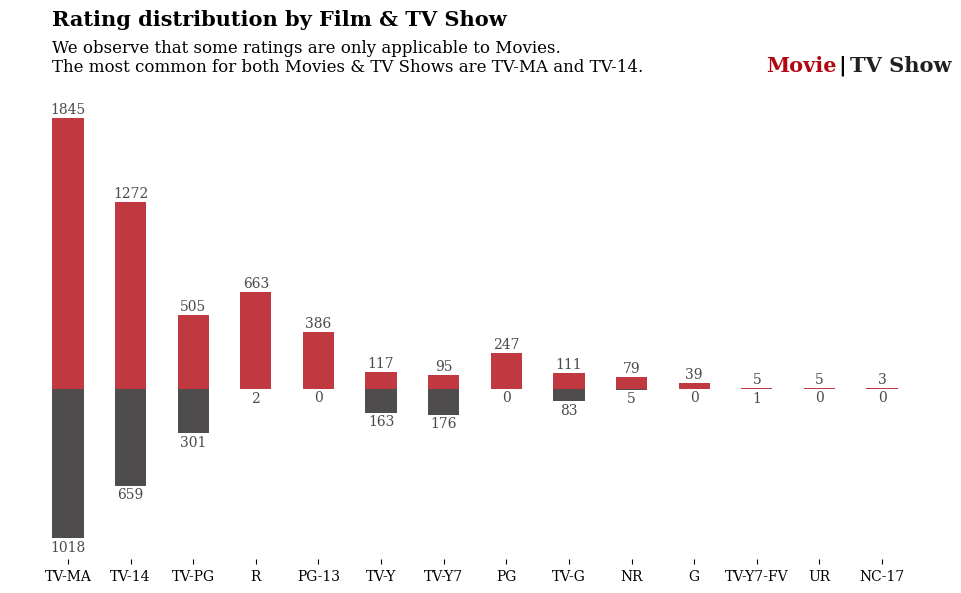

In [ ]:
mf = df.groupby('type')['rating'].value_counts().unstack().sort_index().fillna(0).astype(int)[rating_order]

movie = mf.loc['Movie']
tv = - mf.loc['TV Show']


fig, ax = plt.subplots(1,1, figsize=(12, 6))
ax.bar(movie.index, movie, width=0.5, color='#b20710', alpha=0.8, label='Movie')
ax.bar(tv.index, tv, width=0.5, color='#221f1f', alpha=0.8, label='TV Show')
#ax.set_ylim(-35, 50)

# Annotations
for i in tv.index:
    ax.annotate(f"{-tv[i]}",
                   xy=(i, tv[i] - 60),
                   va = 'center', ha='center',fontweight='light', fontfamily='serif',
                   color='#4a4a4a')

for i in movie.index:
    ax.annotate(f"{movie[i]}",
                   xy=(i, movie[i] + 60),
                   va = 'center', ha='center',fontweight='light', fontfamily='serif',
                   color='#4a4a4a')



for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

ax.set_xticklabels(mf.columns, fontfamily='serif')
ax.set_yticks([])

ax.legend().set_visible(False)
fig.text(0.16, 1, 'Rating distribution by Film & TV Show', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(0.16, 0.89,
'''We observe that some ratings are only applicable to Movies.
The most common for both Movies & TV Shows are TV-MA and TV-14.
'''

, fontsize=12, fontweight='light', fontfamily='serif')


fig.text(0.755,0.924,"Movie", fontweight="bold", fontfamily='serif', fontsize=15, color='#b20710')
fig.text(0.815,0.924,"|", fontweight="bold", fontfamily='serif', fontsize=15, color='black')
fig.text(0.825,0.924,"TV Show", fontweight="bold", fontfamily='serif', fontsize=15, color='#221f1f')

plt.show()

In [ ]:
# Changing the values in the rating column
rating_map = {'TV-MA':'Adults',
              'R':'Adults',
              'PG-13':'Teens',
              'TV-14':'Young Adults',
              'TV-PG':'Older Kids',
              'NR':'Adults',
              'TV-G':'Kids',
              'TV-Y':'Kids',
              'TV-Y7':'Older Kids',
              'PG':'Older Kids',
              'G':'Kids',
              'NC-17':'Adults',
              'TV-Y7-FV':'Older Kids',
              'UR':'Adults'}

df['rating'].replace(rating_map, inplace = True)
df['rating'].unique()

array(['Adults', 'Teens', 'Young Adults', 'Older Kids', 'Kids', nan],
      dtype=object)

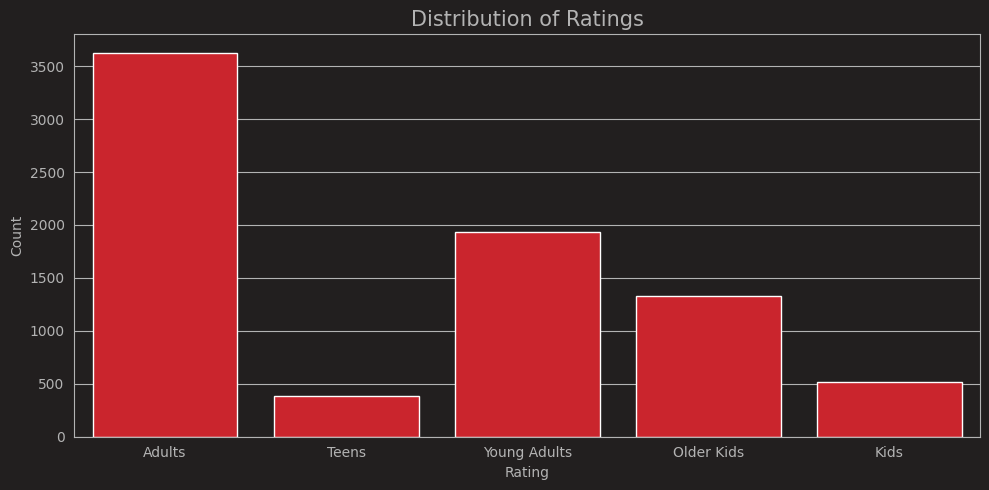

In [ ]:
# Age ratings for shows in the dataset
import seaborn as sns
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Set Seaborn style with Netflix theme
sns.set_style("darkgrid", {"axes.facecolor": netflix_gray, "grid.color": netflix_light_gray})

# Create the countplot with Netflix palette
plt.figure(figsize=(10, 5), facecolor=netflix_gray)
count_plot = sns.countplot(x='rating', data=df, palette=[netflix_red])

# Customize title and labels
count_plot.set_title('Distribution of Ratings', size=15, color=netflix_light_gray)
count_plot.set_xlabel('Rating', color=netflix_light_gray)
count_plot.set_ylabel('Count', color=netflix_light_gray)

# Customize tick labels and spines
count_plot.tick_params(axis='x', colors=netflix_light_gray)
count_plot.tick_params(axis='y', colors=netflix_light_gray)
count_plot.spines['bottom'].set_color(netflix_light_gray)
count_plot.spines['top'].set_color(netflix_light_gray)
count_plot.spines['right'].set_color(netflix_light_gray)
count_plot.spines['left'].set_color(netflix_light_gray)

# Show the plot
plt.tight_layout()
plt.show()



Around 50% of shows on Netflix are produced for adult audience. Followed by young adults, older kids and kids. Netflix has the least number of shows that are specifically produced for teenagers than other age groups.

In [ ]:
# Genres
from sklearn.preprocessing import MultiLabelBinarizer

import matplotlib.colors


# Custom colour map based on Netflix palette
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['#221f1f', '#b20710','#f5f5f1'])



def genre_heatmap(df, title):
    df['genre'] = df['listed_in'].apply(lambda x :  x.replace(' ,',',').replace(', ',',').split(','))
    Types = []
    for i in df['genre']: Types += i
    Types = set(Types)
    print("There are {} types in the Netflix {} Dataset".format(len(Types),title))
    test = df['genre']
    mlb = MultiLabelBinarizer()
    res = pd.DataFrame(mlb.fit_transform(test), columns=mlb.classes_, index=test.index)
    corr = res.corr()
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    fig, ax = plt.subplots(figsize=(10, 7))
    fig.text(.54,.88,'Genre correlation', fontfamily='serif',fontweight='bold',fontsize=15)
    fig.text(.75,.665,
            '''
             It is interesting that Independant Movies
             tend to be Dramas.

             Another observation is that
             Internatinal Movies are rarely
             in the Children's genre.
             ''', fontfamily='serif',fontsize=12,ha='right')
    pl = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, vmin=-.3, center=0, square=True, linewidths=2.5)

    plt.show()

There are 36 types in the Netflix Movies Dataset


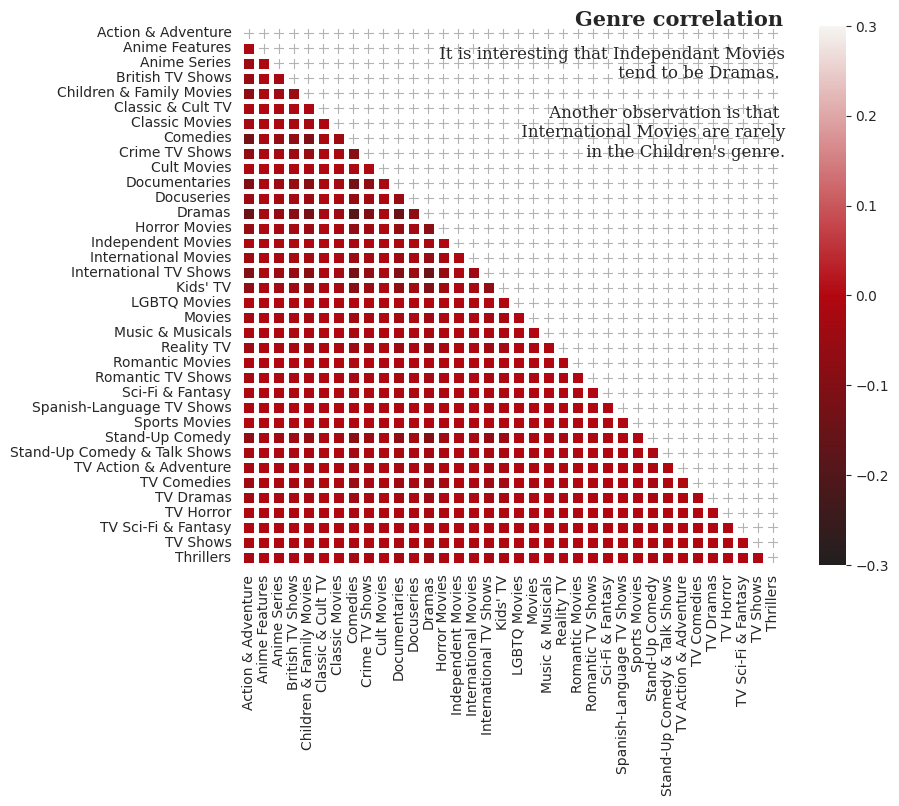

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import MultiLabelBinarizer
import matplotlib.colors


# Custom colour map based on Netflix palette
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ['#221f1f', '#b20710','#f5f5f1'])



def genre_heatmap(df, title):
    df['genre'] = df['listed_in'].apply(lambda x :  x.replace(' ,',',').replace(', ',',').split(','))
    Types = []
    for i in df['genre']: Types += i
    Types = set(Types)
    print("There are {} types in the Netflix {} Dataset".format(len(Types),title))
    test = df['genre']
    mlb = MultiLabelBinarizer()
    res = pd.DataFrame(mlb.fit_transform(test), columns=mlb.classes_, index=test.index)
    corr = res.corr()
    # Use bool instead of np.bool
    mask = np.zeros_like(corr, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    fig, ax = plt.subplots(figsize=(10, 7))
    fig.text(.54,.88,'Genre correlation', fontfamily='serif',fontweight='bold',fontsize=15)
    fig.text(.75,.665,
            '''
             It is interesting that Independant Movies
             tend to be Dramas.

             Another observation is that
             International Movies are rarely
             in the Children's genre.
             ''', fontfamily='serif',fontsize=12,ha='right')
    pl = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, vmin=-.3, center=0, square=True, linewidths=2.5)

    plt.show()

genre_heatmap(df, "Movies")

Children's & Family Movies show limited correlation with most adult-oriented genres.

Stand-up Comedy appears relatively isolated, showing weaker correlations with most other genres.

Music & Musicals show moderate correlations with Romance and Drama categories

Let's make a wordcloud based on the title

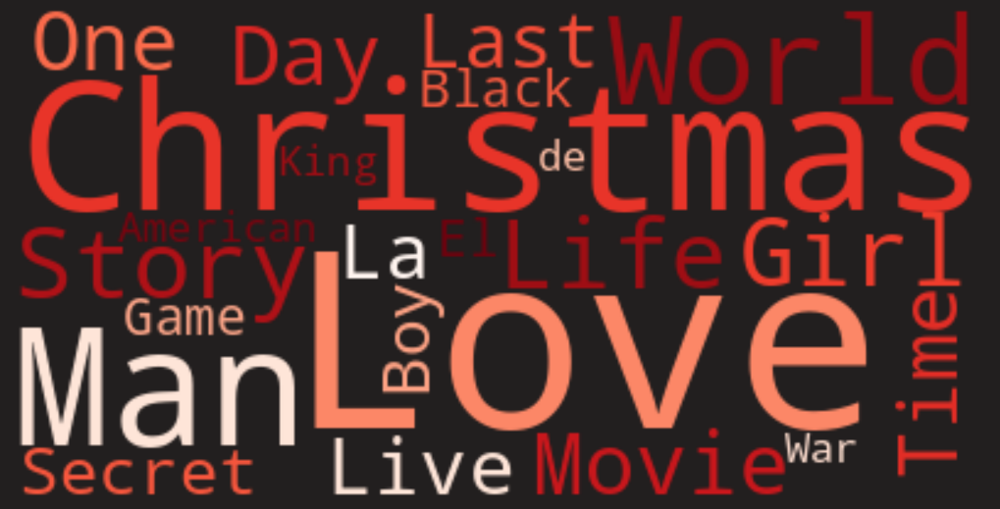

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Text documents
text = " ".join(word for word in df['title'])

# Create the word cloud using Netflix brand colors
wordcloud = WordCloud(
    stopwords=STOPWORDS,
    background_color=netflix_gray,  # Netflix Gray background
    colormap='Reds',  # Use shades of red for the word colors
    min_font_size=15
).generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 6), facecolor=netflix_gray)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")  # Turn off the axes
plt.tight_layout(pad=0)
plt.show()


Words like 'Love', 'Christmas', 'Man', 'World', 'Life', 'Girl', and 'Story' are frequently used in the movie title column

Let's look into the cast.

In [ ]:
df['cast']

,cast
0,"João Miguel, Bianca Comparato, Michel Gomes, R..."
1,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ..."
2,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ..."
3,"Elijah Wood, John C. Reilly, Jennifer Connelly..."
4,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar..."
...,...
7782,"Imad Creidi, Antoinette Turk, Elias Gergi, Car..."
7783,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan..."
7784,Nasty C
7785,"Adriano Zumbo, Rachel Khoo"


In [ ]:
# seperating actors from cast column
cast = df['cast'].str.split(', ', expand=True).stack()

In [ ]:
# top actors name who play highest role in movie/show.
cast.value_counts()

,count
Anupam Kher,42
Shah Rukh Khan,35
Naseeruddin Shah,30
Om Puri,30
Akshay Kumar,29
...,...
Archie Alemania,1
Demore Barnes,1
Marty Adams,1
Nicole Boivin,1


In [ ]:
print(f"Number of TV Shows actors: {len(df[df['type']=='TV Show']['cast'].str.split(', ',expand=True).stack().value_counts())}")
print(f"Number of Movies actors: {len(df[df['type']=='Movie']['cast'].str.split(', ', expand=True).stack().value_counts())}")


Number of TV Shows actors: 13585
Number of Movies actors: 23049


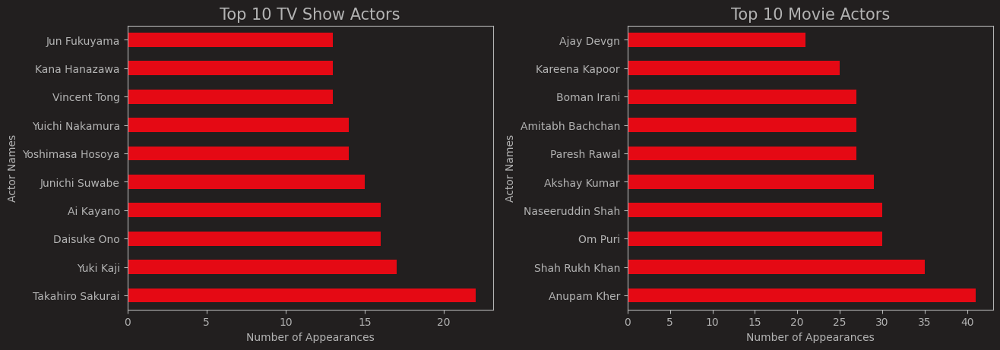

In [ ]:
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Create subplots with Netflix branding
fig, ax = plt.subplots(1, 2, figsize=(14, 5), facecolor=netflix_gray)

# Separating TV shows actors from the cast column
top_TVshows_actor = df[df['type'] == 'TV Show']['cast'].str.split(', ', expand=True).stack()
# Plotting actors who appeared in the highest number of TV shows
a = top_TVshows_actor.value_counts().head(10).plot(
    kind='barh', ax=ax[0], color=netflix_red
)
a.set_title('Top 10 TV Show Actors', size=15, color=netflix_light_gray)
a.set_facecolor(netflix_gray)
a.tick_params(colors=netflix_light_gray)
a.set_xlabel('Number of Appearances', color=netflix_light_gray)
a.set_ylabel('Actor Names', color=netflix_light_gray)
a.spines['bottom'].set_color(netflix_light_gray)
a.spines['top'].set_color(netflix_light_gray)
a.spines['right'].set_color(netflix_light_gray)
a.spines['left'].set_color(netflix_light_gray)

# Separating movie actors from the cast column
top_movie_actor = df[df['type'] == 'Movie']['cast'].str.split(', ', expand=True).stack()
# Plotting actors who appeared in the highest number of movies
b = top_movie_actor.value_counts().head(10).plot(
    kind='barh', ax=ax[1], color=netflix_red
)
b.set_title('Top 10 Movie Actors', size=15, color=netflix_light_gray)
b.set_facecolor(netflix_gray)
b.tick_params(colors=netflix_light_gray)
b.set_xlabel('Number of Appearances', color=netflix_light_gray)
b.set_ylabel('Actor Names', color=netflix_light_gray)
b.spines['bottom'].set_color(netflix_light_gray)
b.spines['top'].set_color(netflix_light_gray)
b.spines['right'].set_color(netflix_light_gray)
b.spines['left'].set_color(netflix_light_gray)

# Adjust layout and aesthetics
plt.tight_layout(pad=1.2, rect=[0, 0, 0.95, 0.95])
plt.show()


Observations:

The majority of the roles in the movies are played by Anupam Kher, Shahrukh Khan, and Om Puri.
In the shows, Takahiro Sakurai, Yuki Kaji, and Daisuke Ono played the most number of roles.

Let's analyse Release Year column.

In [ ]:
# number of unique values
df['release_year'].nunique()

73

In [ ]:
print(f'Oldest release year : {df.release_year.min()}')
print(f'Latest release year : {df.release_year.max()}')

Oldest release year : 1925
Latest release year : 2021


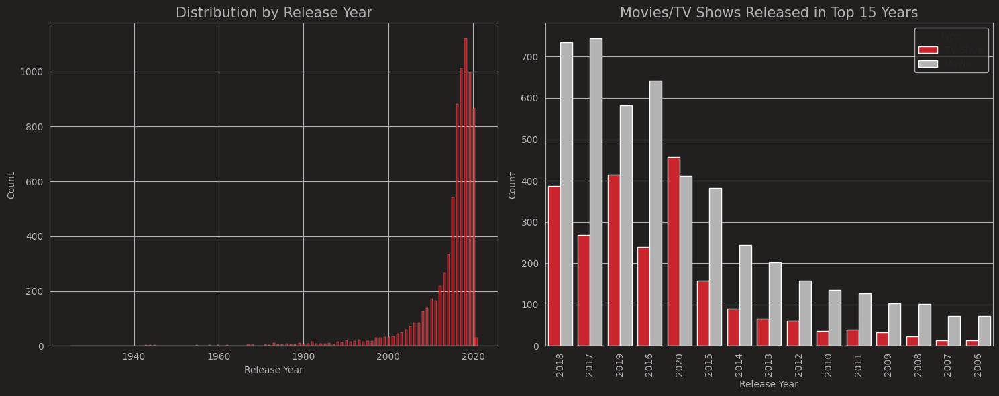

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Set Seaborn style with Netflix theme
sns.set_style("darkgrid", {"axes.facecolor": netflix_gray, "grid.color": netflix_light_gray})

fig, ax = plt.subplots(1, 2, figsize=(15, 6), facecolor=netflix_gray)  # Figure background

# Univariate analysis - Distribution by release year
hist = sns.histplot(df['release_year'], ax=ax[0], color=netflix_red)
hist.set_title('Distribution by Release Year', size=15, color=netflix_light_gray)
hist.set_xlabel('Release Year', color=netflix_light_gray)
hist.set_ylabel('Count', color=netflix_light_gray)
hist.tick_params(colors=netflix_light_gray)
hist.spines['bottom'].set_color(netflix_light_gray)
hist.spines['top'].set_color(netflix_light_gray)
hist.spines['right'].set_color(netflix_light_gray)
hist.spines['left'].set_color(netflix_light_gray)

# Bivariate analysis - Movie/TV shows released in top 15 years
count = sns.countplot(
    x="release_year",
    hue="type",
    data=df,
    order=df['release_year'].value_counts().index[:15],
    ax=ax[1],
    palette=[netflix_red, netflix_light_gray]
)
count.set_title('Movies/TV Shows Released in Top 15 Years', size=15, color=netflix_light_gray)
count.set_xlabel('Release Year', color=netflix_light_gray)
count.set_ylabel('Count', color=netflix_light_gray)
count.tick_params(colors=netflix_light_gray)
count.spines['bottom'].set_color(netflix_light_gray)
count.spines['top'].set_color(netflix_light_gray)
count.spines['right'].set_color(netflix_light_gray)
count.spines['left'].set_color(netflix_light_gray)
plt.xticks(rotation=90, color=netflix_light_gray)
plt.yticks(color=netflix_light_gray)

# Adjust layout
plt.tight_layout()
plt.show()


Observations:

Netflix prefers adding newer titles in comparison to older titles.

Most Movies and TV shows that are available on Netflix have been released between 2015 and 2020, and the highest are in 2018

Now let's analyse genres i.e., listed_in columns:

In [ ]:
df['listed_in'].head()

,listed_in
0,"International TV Shows, TV Dramas, TV Sci-Fi &..."
1,"Dramas, International Movies"
2,"Horror Movies, International Movies"
3,"Action & Adventure, Independent Movies, Sci-Fi..."
4,Dramas


Because this column is a genre column, in order to count the genres, we must separate them.

In [ ]:
# seperating genre from listed_in columns for analysis purpose
genres = df['listed_in'].str.split(', ', expand=True).stack()

# top 10 genres in listed movies/TV shows
genres = genres.value_counts().reset_index().rename(columns={'index':'genre', 0:'count'})
genres.head()

,genre,count
0,International Movies,2437
1,Dramas,2106
2,Comedies,1471
3,International TV Shows,1199
4,Documentaries,786


In [ ]:
# number of genres present in dataset
len(genres)

42

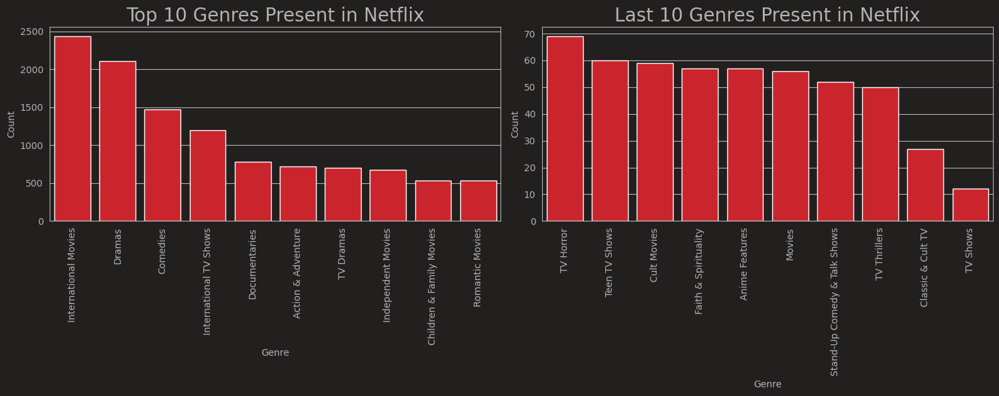

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Set Seaborn style with Netflix theme
sns.set_style("darkgrid", {"axes.facecolor": netflix_gray, "grid.color": netflix_light_gray})

# Create subplots with Netflix branding
fig, ax = plt.subplots(1, 2, figsize=(15, 6), facecolor=netflix_gray)  # Figure background

# Top 10 genres
top = sns.barplot(x='genre', y='count', data=genres[:10], ax=ax[0], color=netflix_red)
top.set_title('Top 10 Genres Present in Netflix', size=20, color=netflix_light_gray)
top.set_xlabel('Genre', color=netflix_light_gray)
top.set_ylabel('Count', color=netflix_light_gray)
top.tick_params(axis='x', colors=netflix_light_gray)
top.tick_params(axis='y', colors=netflix_light_gray)
top.spines['bottom'].set_color(netflix_light_gray)
top.spines['top'].set_color(netflix_light_gray)
top.spines['right'].set_color(netflix_light_gray)
top.spines['left'].set_color(netflix_light_gray)
plt.setp(top.get_xticklabels(), rotation=90, color=netflix_light_gray)

# Last 10 genres
bottom = sns.barplot(x='genre', y='count', data=genres[-10:], ax=ax[1], color=netflix_red)
bottom.set_title('Last 10 Genres Present in Netflix', size=20, color=netflix_light_gray)
bottom.set_xlabel('Genre', color=netflix_light_gray)
bottom.set_ylabel('Count', color=netflix_light_gray)
bottom.tick_params(axis='x', colors=netflix_light_gray)
bottom.tick_params(axis='y', colors=netflix_light_gray)
bottom.spines['bottom'].set_color(netflix_light_gray)
bottom.spines['top'].set_color(netflix_light_gray)
bottom.spines['right'].set_color(netflix_light_gray)
bottom.spines['left'].set_color(netflix_light_gray)
plt.xticks(rotation=90, color=netflix_light_gray)

# Adjust layout
plt.tight_layout()
plt.show()


Observations:

International Movies, Dramas, and Comedies make up the majority of the genres.
TV Shows, Classic and cult TV, TV thrillers, Stand-Up comedy, and Talk shows account for the least genres.

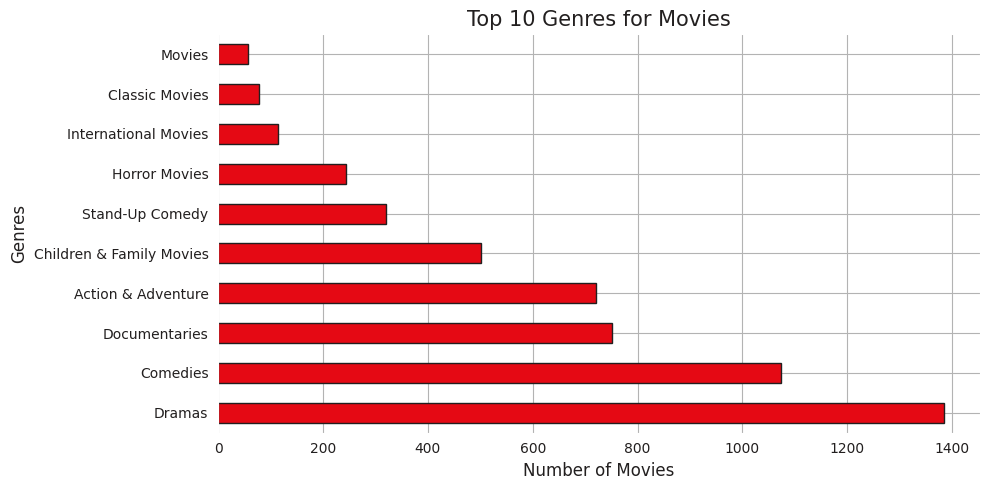

In [ ]:
import matplotlib.pyplot as plt

# Set Netflix brand colors
netflix_red = "#E50914"
netflix_black = "#221f1f"

# Create the plot
plt.figure(figsize=(10, 5))
df[df['type'] == 'Movie'].listed_in.value_counts().nlargest(10).plot(
    kind='barh',
    color=netflix_red,
    edgecolor=netflix_black
)

# Add title and labels
plt.title('Top 10 Genres for Movies', fontsize=15, color=netflix_black)
plt.xlabel('Number of Movies', fontsize=12, color=netflix_black)
plt.ylabel('Genres', fontsize=12, color=netflix_black)

# Customize ticks
plt.xticks(color=netflix_black)
plt.yticks(color=netflix_black)

# Set background colors
plt.gca().set_facecolor('white')  # Axes background
plt.gcf().set_facecolor('white')  # Figure background

# Final layout adjustments
plt.tight_layout()
plt.show()


Dramas, comedies, and documentaries are the most popular genre for the movies on Netflix.

Now, let's analyse top genres for TV Shows.

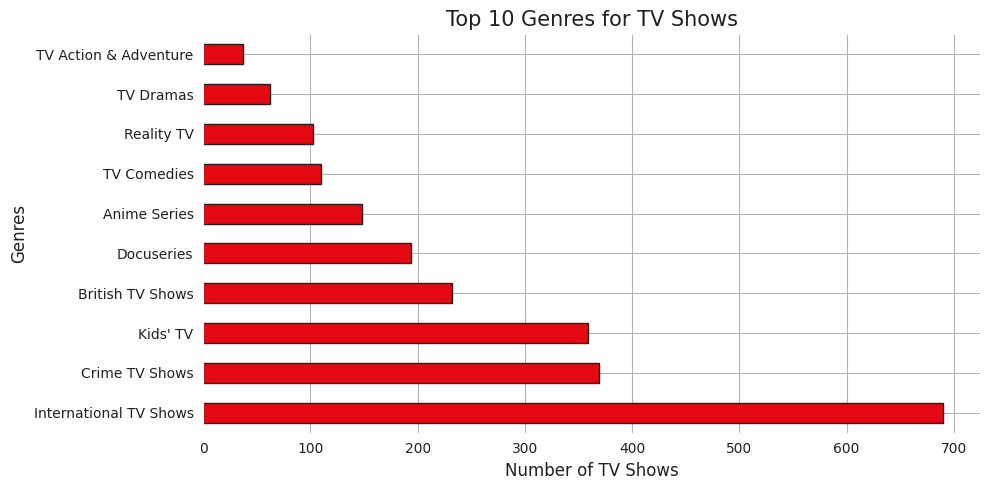

In [ ]:
import matplotlib.pyplot as plt

# Set Netflix brand colors
netflix_red = "#E50914"
netflix_black = "#221f1f"

# Create the plot
plt.figure(figsize=(10, 5))
df[df['type'] == 'TV Show'].listed_in.value_counts().nlargest(10).plot(
    kind='barh',
    color=netflix_red,
    edgecolor=netflix_black
)

# Add title and labels
plt.title('Top 10 Genres for TV Shows', fontsize=15, color=netflix_black)
plt.xlabel('Number of TV Shows', fontsize=12, color=netflix_black)
plt.ylabel('Genres', fontsize=12, color=netflix_black)

# Customize ticks
plt.xticks(color=netflix_black)
plt.yticks(color=netflix_black)

# Set background colors
plt.gca().set_facecolor('white')  # Axes background
plt.gcf().set_facecolor('white')  # Figure background

# Final layout adjustments
plt.tight_layout()
plt.show()


International shows, crime, and kids are the most popular genre for TV shows on Netflix.

Let's analyse description column:

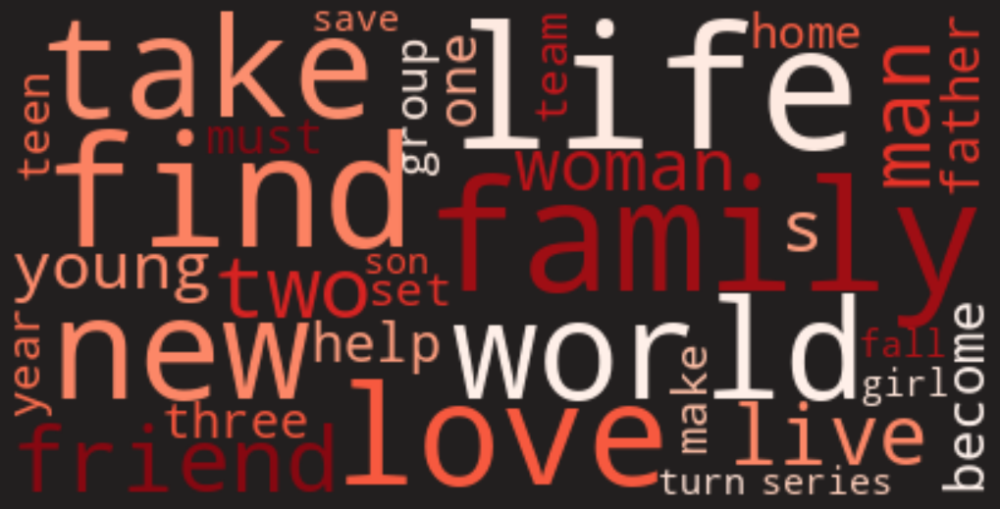

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Create the word cloud using Netflix brand colors
wordcloud = WordCloud(
    stopwords=STOPWORDS,
    background_color=netflix_gray,  # Netflix Gray background
    colormap='Reds',  # Use shades of red for the word colors
    min_font_size=15
).generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 6), facecolor=netflix_gray)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")  # Turn off the axes
plt.tight_layout(pad=0)
plt.show()


The most frequently used words in the description column are "family," "find," "life," "love," "new world," and "friend."

Let's analyse the date added column:

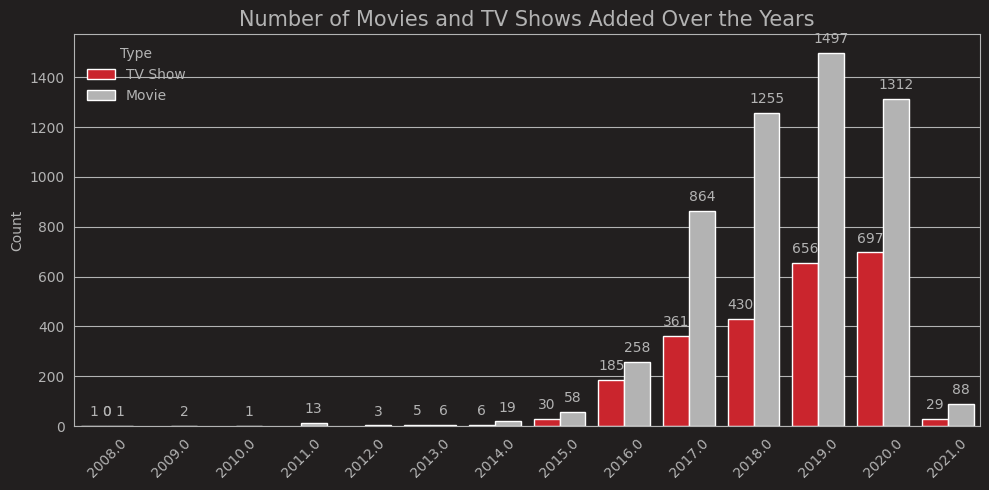

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Set Seaborn style with Netflix theme
sns.set_style("darkgrid", {"axes.facecolor": netflix_gray, "grid.color": netflix_light_gray})

# Create the plot
plt.figure(figsize=(10, 5), facecolor=netflix_gray)
p = sns.countplot(x='year_added', data=df, hue='type', palette=[netflix_red, netflix_light_gray])

# Customize title and labels
p.set_title('Number of Movies and TV Shows Added Over the Years', size=15, color=netflix_light_gray)
p.set_xlabel('')
p.set_ylabel('Count', color=netflix_light_gray)
p.tick_params(axis='x', colors=netflix_light_gray)
p.tick_params(axis='y', colors=netflix_light_gray)

# Annotate bars with their values
for i in p.patches:
    p.annotate(
        format(i.get_height(), '.0f'),
        (i.get_x() + i.get_width() / 2., i.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),
        textcoords='offset points',
        color=netflix_light_gray
    )

# Customize spines
p.spines['bottom'].set_color(netflix_light_gray)
p.spines['top'].set_color(netflix_light_gray)
p.spines['right'].set_color(netflix_light_gray)
p.spines['left'].set_color(netflix_light_gray)

# Customize legend
legend = plt.legend(title='Type', loc='upper left', frameon=False)
plt.setp(legend.get_texts(), color=netflix_light_gray)  # Set legend text color
plt.setp(legend.get_title(), color=netflix_light_gray)  # Set legend title color

# Rotate x-tick labels for better visibility
plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()
plt.show()


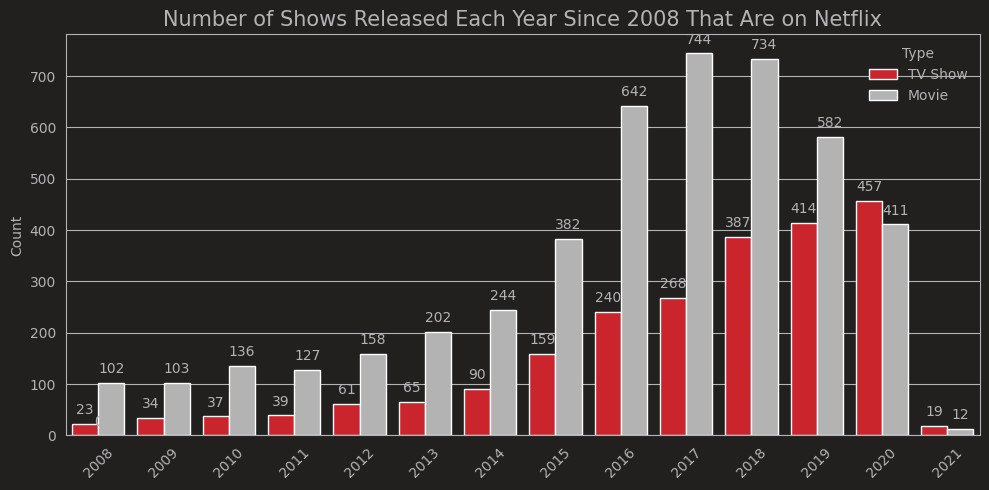

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Netflix colors
netflix_red = "#E50914"
netflix_gray = "#221F1F"
netflix_light_gray = "#B3B3B3"

# Set Seaborn style with Netflix theme
sns.set_style("darkgrid", {"axes.facecolor": netflix_gray, "grid.color": netflix_light_gray})

# Number of shows released each year since 2008
order = range(2008, 2022)
plt.figure(figsize=(10, 5), facecolor=netflix_gray)
p = sns.countplot(
    x='release_year',
    data=df,
    hue='type',
    order=order,
    palette=[netflix_red, netflix_light_gray]  # Netflix palette for the bars
)

# Customize title and labels
p.set_title('Number of Shows Released Each Year Since 2008 That Are on Netflix', size=15, color=netflix_light_gray)
p.set_xlabel('')
p.set_ylabel('Count', color=netflix_light_gray)
p.tick_params(axis='x', colors=netflix_light_gray)
p.tick_params(axis='y', colors=netflix_light_gray)

# Annotate bars with their values
for i in p.patches:
    p.annotate(
        format(i.get_height(), '.0f'),
        (i.get_x() + i.get_width() / 2., i.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),
        textcoords='offset points',
        color=netflix_light_gray  # Annotation color
    )

# Customize legend
legend = plt.legend(title='Type', loc='upper right', frameon=False)
plt.setp(legend.get_texts(), color=netflix_light_gray)  # Set legend text color
plt.setp(legend.get_title(), color=netflix_light_gray)  # Set legend title color

# Customize spines
p.spines['bottom'].set_color(netflix_light_gray)
p.spines['top'].set_color(netflix_light_gray)
p.spines['right'].set_color(netflix_light_gray)
p.spines['left'].set_color(netflix_light_gray)

# Rotate x-tick labels for better visibility
plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()
plt.show()


**How has content been added over the years?**

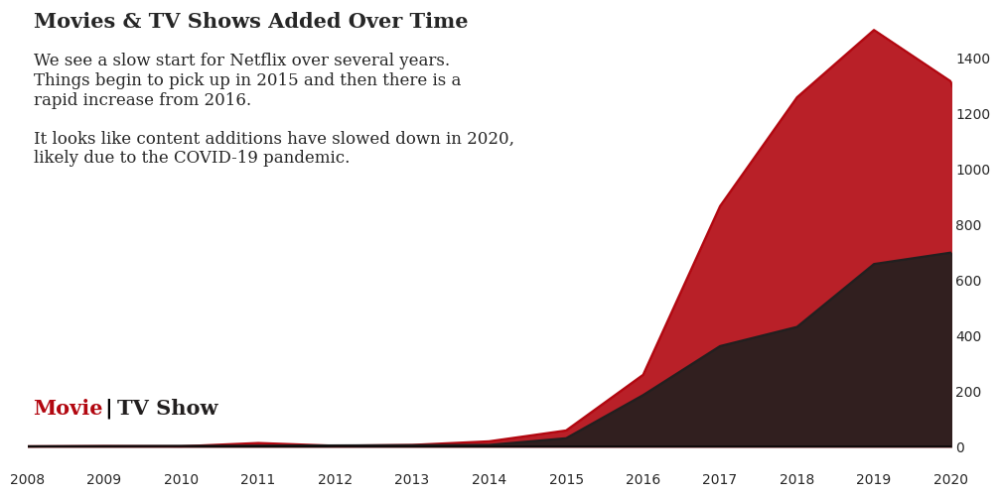

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Plot configuration
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
color = ["#b20710", "#221f1f"]  # Netflix Red and Gray

# Iterate over 'Movies' and 'TV Shows' to plot
for i, mtv in enumerate(df['type'].value_counts().index):
    mtv_rel = df[df['type'] == mtv]['year_added'].value_counts().sort_index()
    ax.plot(mtv_rel.index, mtv_rel, color=color[i], label=mtv)
    ax.fill_between(mtv_rel.index, 0, mtv_rel, color=color[i], alpha=0.9)

# Adjust ticks and horizontal line
ax.yaxis.tick_right()
ax.axhline(y=0, color='black', linewidth=1.3, alpha=0.7)

# Hide spines for a minimalist style
for s in ['top', 'right', 'bottom', 'left']:
    ax.spines[s].set_visible(False)

# Disable grid
ax.grid(False)

# Set x-axis range and ticks
ax.set_xlim(2008, 2020)
plt.xticks(np.arange(2008, 2021, 1))

# Add text annotations
fig.text(0.13, 0.85, 'Movies & TV Shows Added Over Time', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(
    0.13, 0.59,
    '''We see a slow start for Netflix over several years.
Things begin to pick up in 2015 and then there is a
rapid increase from 2016.

It looks like content additions have slowed down in 2020,
likely due to the COVID-19 pandemic.
''',
    fontsize=12, fontweight='light', fontfamily='serif'
)

# Add legend-like labels
fig.text(0.13, 0.2, "Movie", fontweight="bold", fontfamily='serif', fontsize=15, color='#b20710')
fig.text(0.19, 0.2, "|", fontweight="bold", fontfamily='serif', fontsize=15, color='black')
fig.text(0.2, 0.2, "TV Show", fontweight="bold", fontfamily='serif', fontsize=15, color='#221f1f')

# Remove tick lengths for cleaner look
ax.tick_params(axis='both', which='both', length=0)

# Set white background for figure and axes
fig.patch.set_facecolor('white')  # Set figure background to white
ax.set_facecolor('white')         # Set axes background to white

# Show plot
plt.show()


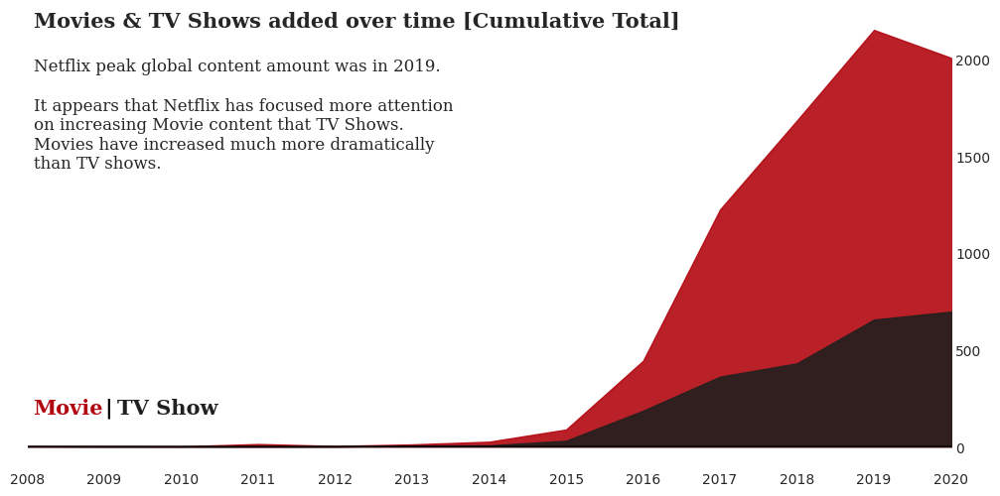

In [ ]:
data_sub = df.groupby('type')['year_added'].value_counts().unstack().fillna(0).loc[['TV Show','Movie']].cumsum(axis=0).T

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
color = ["#b20710", "#221f1f"]

for i, mtv in enumerate(df['type'].value_counts().index):
    mtv_rel = data_sub[mtv]
    ax.fill_between(mtv_rel.index, 0, mtv_rel, color=color[i], label=mtv,alpha=0.9)



ax.yaxis.tick_right()

ax.axhline(y = 0, color = 'black', linewidth = 1.3, alpha = .7)

#ax.set_ylim(0, 50)
#ax.legend(loc='upper left')
for s in ['top', 'right','bottom','left']:
    ax.spines[s].set_visible(False)

ax.grid(False)

ax.set_xlim(2008,2020)
plt.xticks(np.arange(2008, 2021, 1))

fig.text(0.13, 0.85, 'Movies & TV Shows added over time [Cumulative Total]', fontsize=15, fontweight='bold', fontfamily='serif')
fig.text(0.13, 0.58,
'''Netflix peak global content amount was in 2019.

It appears that Netflix has focused more attention
on increasing Movie content that TV Shows.
Movies have increased much more dramatically
than TV shows.
'''

, fontsize=12, fontweight='light', fontfamily='serif')



fig.text(0.13,0.2,"Movie", fontweight="bold", fontfamily='serif', fontsize=15, color='#b20710')
fig.text(0.19,0.2,"|", fontweight="bold", fontfamily='serif', fontsize=15, color='black')
fig.text(0.2,0.2,"TV Show", fontweight="bold", fontfamily='serif', fontsize=15, color='#221f1f')

ax.tick_params(axis=u'both', which=u'both',length=0)


plt.show()

Over the years, Netflix has consistently focused on adding more shows in its platform.

Though there was a decrease in the number of movies added in 2020, this pattern did not exist in the number of TV shows added in the same year.

This might signal that Netflix is increasingly concentrating on introducing more TV series to its platform.

Durations Column:

No.of Seasons in each TV show:

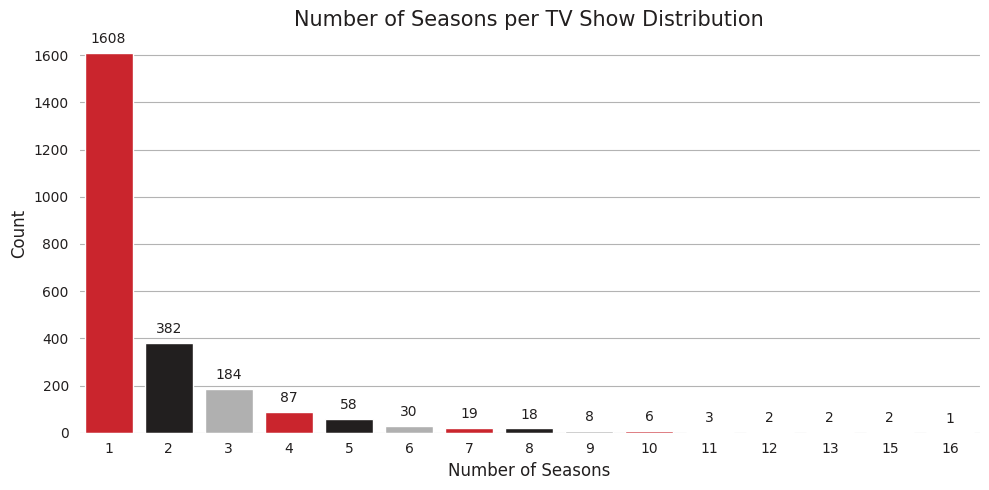

In [ ]:
# Seasons in each TV show
import matplotlib.pyplot as plt
import seaborn as sns

# Set Netflix brand colors
netflix_red = "#E50914"
netflix_black = "#221f1f"
netflix_gray = "#B0B0B0"

# Create the plot
plt.figure(figsize=(10, 5))
p = sns.countplot(
    x='duration',
    data=df[df['type'] == 'TV Show'],
    palette=[netflix_red, netflix_black, netflix_gray]
)
plt.title('Number of Seasons per TV Show Distribution', fontsize=15, color=netflix_black)
plt.xlabel('Number of Seasons', fontsize=12, color=netflix_black)
plt.ylabel('Count', fontsize=12, color=netflix_black)

# Annotate bars
for i in p.patches:
    p.annotate(
        format(i.get_height(), '.0f'),
        (i.get_x() + i.get_width() / 2., i.get_height()),
        ha='center', va='center',
        xytext=(0, 10),
        textcoords='offset points',
        fontsize=10, color=netflix_black
    )

# Customize axes
p.tick_params(axis='x', colors=netflix_black)
p.tick_params(axis='y', colors=netflix_black)

# Set background colors
plt.gca().set_facecolor('white')  # Axes background
plt.gcf().set_facecolor('white')  # Figure background

# Final layout adjustments
plt.tight_layout()
plt.show()


Most of the TV Shows(1608) have only 1 season. This is because, in case of Netflix originals, Netflix either shuts down the production of that show due to poor ratings or feels the show's production is not feesible. In case of other TV shows, Netflix uses these shows to attract more new customers.

In [ ]:
# % of tv shows with just 1 season
len(df[(df['type']=='TV Show') & (df['duration']==1)]) / len(df[df['type']=='TV Show'])* 100

66.7219917012448

The TV series in the dataset have up to 16 seasons, however the bulk of them (66.72%) only have one season.
This might mean that the majority of TV shows has only recently begun, and that further seasons are on the way.

There are very few TV shows that have more than 8 seasons.

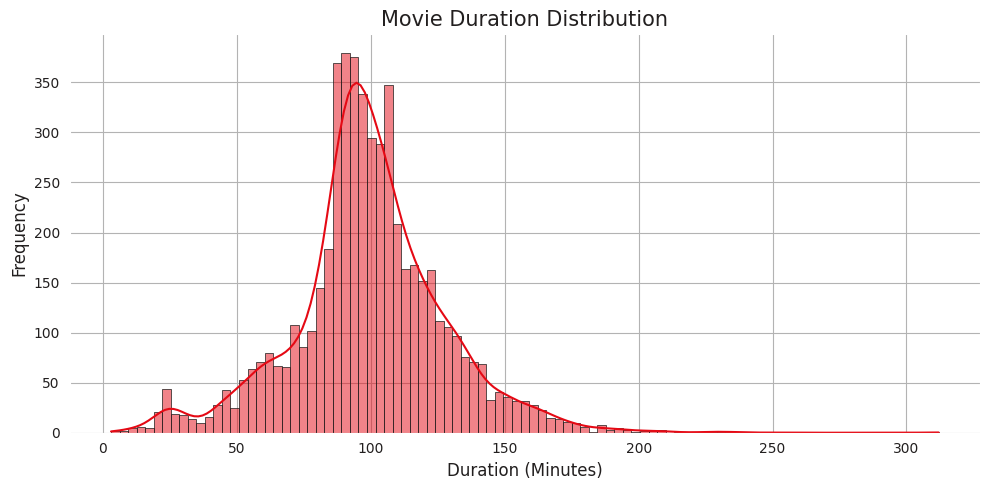

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Netflix brand colors
netflix_red = "#E50914"
netflix_black = "#221f1f"

# Create the plot
plt.figure(figsize=(10, 5))
sns.histplot(
    x='duration',
    data=df[df['type'] == 'Movie'],
    color=netflix_red,
    kde=True,  # Adding a Kernel Density Estimate for smoother distribution
    edgecolor=netflix_black
)
plt.title('Movie Duration Distribution', fontsize=15, color=netflix_black)
plt.xlabel('Duration (Minutes)', fontsize=12, color=netflix_black)
plt.ylabel('Frequency', fontsize=12, color=netflix_black)

# Customize axes
plt.xticks(color=netflix_black)
plt.yticks(color=netflix_black)

# Set background colors
plt.gca().set_facecolor('white')  # Axes background
plt.gcf().set_facecolor('white')  # Figure background

# Final layout adjustments
plt.tight_layout()
plt.show()


In [ ]:
# Movie statistics
df[df['type']== 'Movie'].duration.describe()

,duration
count,5377.000000
mean,99.307978
std,28.530881
min,3.000000
25%,86.000000
50%,98.000000
75%,114.000000
max,312.000000


**The length of a movie may range from 3 min to 312 minutes, and the distribution is almost normally distributed.**


Now lets's analyze length of movie shows over the years:

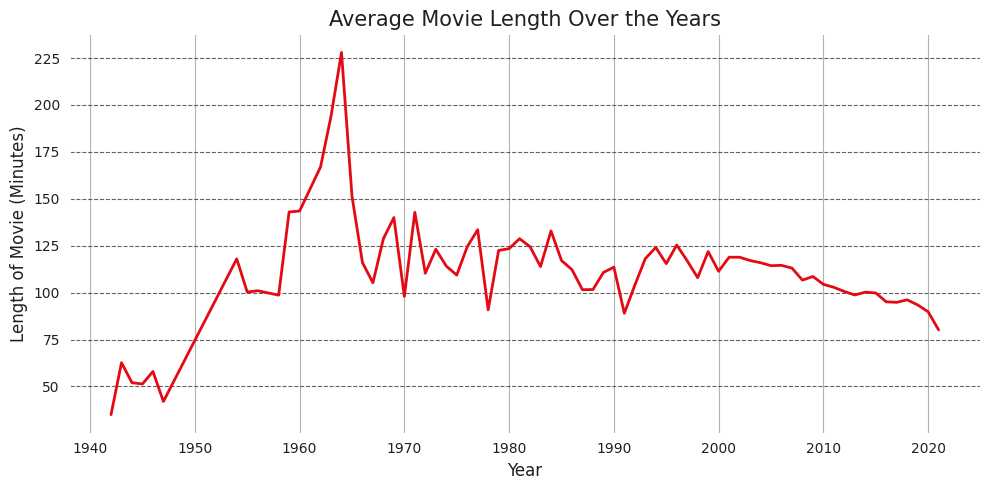

In [ ]:
import matplotlib.pyplot as plt

# Set Netflix brand colors
netflix_red = "#E50914"
netflix_black = "#221f1f"

# Create the plot
plt.figure(figsize=(10, 5))
df[df['type'] == 'Movie'].groupby('release_year')['duration'].mean().plot(
    kind='line',
    color=netflix_red,
    linewidth=2
)

# Add title and labels
plt.title('Average Movie Length Over the Years', fontsize=15, color=netflix_black)
plt.ylabel('Length of Movie (Minutes)', fontsize=12, color=netflix_black)
plt.xlabel('Year', fontsize=12, color=netflix_black)

# Customize ticks
plt.xticks(color=netflix_black)
plt.yticks(color=netflix_black)

# Add a horizontal grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7, color=netflix_black)

# Set background colors
plt.gca().set_facecolor('white')  # Axes background
plt.gcf().set_facecolor('white')  # Figure background

# Final layout adjustments
plt.tight_layout()
plt.show()


In [ ]:
# Movie release year statistics
df[df['type']== 'Movie'].release_year.describe()

,release_year
count,5377.000000
mean,2012.920030
std,9.663282
min,1942.000000
25%,2012.000000
50%,2016.000000
75%,2018.000000
max,2021.000000


Netflix has several movies on its site, including those that were released in way back 1942.

As per the plot, movies made in the 1940s had a fairly short duration on average.

On average, movies made in the 1960s have the longest movie length.

The average length of a movie has been continuously decreasing since the 2000s.

Target Ages:

Does Netflix uniformly target certain demographics? Or does this vary by country?

In [ ]:
#Assigning the Ratings into grouped categories
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
df['target_ages'] = df['rating'].replace(ratings)

In [ ]:
# type should be a category
df['type'] = pd.Categorical(df['type'])
df['target_ages'] = pd.Categorical(df['target_ages'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])


In [ ]:
df.head()


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens


In [ ]:
country=df['country'].value_counts().reset_index()
country

,country,count
0,United States,2883
1,India,956
2,United Kingdom,577
3,nan,507
4,Canada,259
...,...,...
77,Zimbabwe,1
78,Namibia,1
79,Soviet Union,1
80,Iran,1


In [ ]:
# Prepare data for heatmap
# Count occurrences per country
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['country', 'count']

# Filter for top 10 countries
top_countries = country_counts.head(10)['country']

# Filter the dataframe for these top 10 countries
df_heatmap = df[df['country'].isin(top_countries)]

# Create the crosstab for the heatmap
df_heatmap = pd.crosstab(df_heatmap['target_ages'], df_heatmap['country'], normalize="columns")

# Display the resulting dataframe
df_heatmap


country,Canada,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States,nan
target_ages,,,,,,,,,,
Kids,0.174107,0.101190,0.035461,0.012821,0.018349,0.073171,0.039474,0.090726,0.087045,0.235135
Older Kids,0.254464,0.130952,0.368794,0.416667,0.100917,0.195122,0.059211,0.213710,0.229150,0.321622
Teens,0.031250,0.035714,0.009456,0.019231,0.018349,0.000000,0.019737,0.082661,0.114575,0.008108
Adults,0.540179,0.732143,0.586288,0.551282,0.862385,0.731707,0.881579,0.612903,0.569231,0.435135


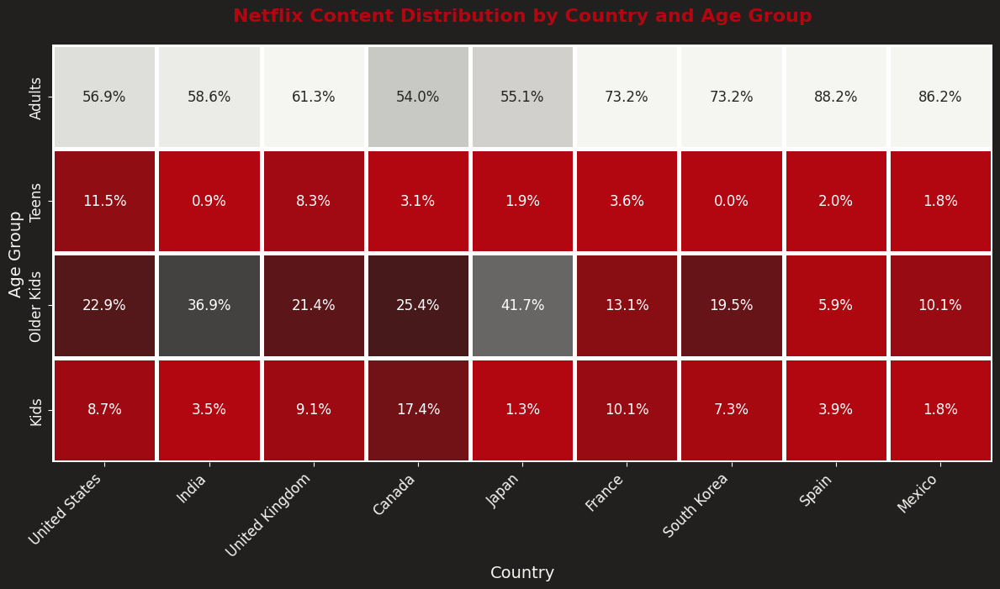

In [ ]:
import matplotlib.colors as mcolors

# Define Netflix color palette for heatmap
netflix_cmap = mcolors.LinearSegmentedColormap.from_list("", ["#b20710", "#221f1f", "#f5f5f1"])

# Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain',
                  'Mexico']

age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(df_heatmap.loc[age_order, country_order2],
            cmap=netflix_cmap, square=True, linewidth=2.5, cbar=False,
            annot=True, fmt='.1%', vmax=.6, vmin=0.05, ax=ax, annot_kws={"fontsize":12})

# Adding labels and title in Netflix style
plt.title('Netflix Content Distribution by Country and Age Group', fontsize=16, fontweight='bold', color="#b20710", pad=20)
plt.xlabel('Country', fontsize=14, color="#f5f5f1")
plt.ylabel('Age Group', fontsize=14, color="#f5f5f1")

# Customize tick labels
ax.tick_params(colors="#f5f5f1", labelsize=12)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

# Set background color
fig.patch.set_facecolor("#221f1f")
ax.set_facecolor("#221f1f")

plt.tight_layout()
plt.show()


Very interesting results.

It is also interesting to note similarities between culturally similar countries - the US & UK are closey aligned with their Netflix target ages, yet vastly different to Japan and India.

Adult Content Dominance:


Adult content makes up the majority of Netflix's library across all countries
Spain (88.2%) and Mexico (86.2%) have the highest proportion of adult content
The US has one of the lower adult content percentages at 56.9%


Teen Content Distribution:


The US has the highest percentage of teen content (11.5%)
South Korea has no teen content (0.0%)
Most other countries have relatively low teen content (1-4%)


Older Kids Content:


Japan has the highest percentage for older kids content (41.7%)
India also shows a significant portion (36.9%)
Spain and Mexico have notably low percentages (5.9% and 10.1% respectively)


Kids Content:


Canada has the highest proportion of kids content (17.4%)
France follows with 10.1%
Japan has the lowest at 1.3%


Regional Patterns:


Asian countries (India, Japan, South Korea) show varying patterns
Western European countries (France, Spain) tend to have higher adult content percentages
North American countries (US, Canada) have more balanced distributions across age groups

Hypothesis Testing:

1.HYPOTHESIS TESTING

HO/NULL HYPOTHESIS: movies rated for kids and older kids are at least two hours long.

H1/ ALTERNATE HYPOTHESIS: movies rated for kids and older kids are not at least two hours long.

In [ ]:
#creating two extra columns
tv_shows=df[df['type']=='TV Show']
movies=df[df['type']=='Movie']

In [ ]:
movies

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,month_added,year_added,genre,count,target_ages
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,Adults,93,Dramas,After a devastating earthquake hits Mexico Cit...,12.0,2016.0,[Dramas],1,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,Adults,78,Horror Movies,"When an army recruit is found dead, his fellow...",12.0,2018.0,[Horror Movies],1,Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,Teens,80,Action & Adventure,"In a postapocalyptic world, rag-doll robots hi...",11.0,2017.0,[Action & Adventure],1,Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,Teens,123,Dramas,A brilliant group of students become card-coun...,1.0,2020.0,[Dramas],1,Teens
6,s7,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,2019,Adults,95,Horror Movies,"After an awful accident, a couple admitted to ...",6.0,2020.0,[Horror Movies],1,Adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7781,s7782,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,2006,Older Kids,88,Children & Family Movies,"Dragged from civilian life, a former superhero...",1.0,2020.0,[Children & Family Movies],1,Older Kids
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...",Sweden,2005,Adults,99,Dramas,When Lebanon's Civil War deprives Zozo of his ...,10.0,2020.0,[Dramas],1,Adults
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,2015,Young Adults,111,Dramas,A scrappy but poor boy worms his way into a ty...,3.0,2019.0,[Dramas],1,NaN
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,nan,2019,Adults,44,Documentaries,"In this documentary, South African rapper Nast...",9.0,2020.0,[Documentaries],1,Adults


In [ ]:
#making copy of df_clean_frame
df_hypothesis=df.copy()
#head of df_hypothesis
df_hypothesis.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,month_added,year_added,genre,count,target_ages
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,Adults,4,International TV Shows,In a future where the elite inhabit an island ...,8.0,2020.0,[International TV Shows],1,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,Adults,93,Dramas,After a devastating earthquake hits Mexico Cit...,12.0,2016.0,[Dramas],1,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,Adults,78,Horror Movies,"When an army recruit is found dead, his fellow...",12.0,2018.0,[Horror Movies],1,Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,Teens,80,Action & Adventure,"In a postapocalyptic world, rag-doll robots hi...",11.0,2017.0,[Action & Adventure],1,Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,Teens,123,Dramas,A brilliant group of students become card-coun...,1.0,2020.0,[Dramas],1,Teens


In [ ]:
#filtering movie from Type_of_show column
df_hypothesis = df_hypothesis[df_hypothesis["type"] == "Movie"]

In [ ]:
#with respect to each ratings assigning it into group of categories
ratings_ages = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

df_hypothesis['target_ages'] = df_hypothesis['rating'].replace(ratings_ages)
#let's see unique target ages
df_hypothesis['target_ages'].unique()

array(['Adults', 'Teens', 'Young Adults', 'Older Kids', 'Kids', nan],
      dtype=object)

In [ ]:
# Convert 'duration' column to string type before using .str accessor
df_hypothesis['duration'] = df_hypothesis['duration'].astype(str)
#from duration feature extractin string part and after extracting Changing the object type to numeric
df_hypothesis['duration']= df_hypothesis['duration'].str.extract('(\d+)')
df_hypothesis['duration'] = pd.to_numeric(df_hypothesis['duration'])
#head of df_
df_hypothesis.head(3)

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,month_added,year_added,genre,count,target_ages
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,Adults,93,Dramas,After a devastating earthquake hits Mexico Cit...,12.0,2016.0,[Dramas],1,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,Adults,78,Horror Movies,"When an army recruit is found dead, his fellow...",12.0,2018.0,[Horror Movies],1,Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,Teens,80,Action & Adventure,"In a postapocalyptic world, rag-doll robots hi...",11.0,2017.0,[Action & Adventure],1,Teens


In [ ]:
#group_by duration and target_ages
group_by_= df_hypothesis[['duration','target_ages']].groupby(by='target_ages')
#mean of group_by variable
group=group_by_.mean().reset_index()
group

,target_ages,duration
0,Kids,66.486891
1,Older Kids,92.024648
2,Teens,107.772021
3,Adults,98.275145


In [ ]:
#group_by duration and target_ages
group_by_= df_hypothesis[['duration','target_ages']].groupby(by='target_ages')
#mean of group_by variable
group=group_by_.mean().reset_index()
group

#In A and B variable grouping values
A= group_by_.get_group('Kids')
B= group_by_.get_group('Older Kids')
#mean and std. calutation for kids and older kids variables

# Calculate the mean of 'duration' for each group
M1 = A['duration'].mean()  # Select the 'duration' column and calculate the mean
S1 = A['duration'].std()   # Select the 'duration' column and calculate the standard deviation

M2 = B['duration'].mean()  # Select the 'duration' column and calculate the mean
S2 = B['duration'].std()   # Select the 'duration' column and calculate the standard deviation

print('Mean for movies rated for Kids {} \n Mean for  movies rated for older kids {}'.format(M1,M2))
print('Std for  movies rated for Older Kids {} \n Std for  movies rated for kids {}'.format(S2,S1))

Mean for movies rated for Kids 66.48689138576779 
 Mean for  movies rated for older kids 92.02464788732394
Std for  movies rated for Older Kids 31.18257675842998 
 Std for  movies rated for kids 31.739464779840162


In [ ]:
#import stats
from scipy import stats
#length of groups and DOF
n1 = len(A)
n2= len(B)
print(n1,n2)

dof = n1+n2-2
print('dof',dof)

sp_2 = ((n2-1)*S1**2  + (n1-1)*S2**2) / dof
print('SP_2 =',sp_2)

sp = np.sqrt(sp_2)
print('SP',sp)

#tvalue
t_val = (M1-M2)/(sp * np.sqrt(1/n1 + 1/n2))
print('tvalue',t_val) # Remove [0] to print the scalar value directly

267 852
dof 1117
SP_2 = 999.0491470682077
SP 31.60773872120889
tvalue -11.519926278533966


In [ ]:
#t-distribution
stats.t.ppf(0.025,dof)

-1.9620900365868952

In [ ]:
#t-distribution
stats.t.ppf(0.975,dof)

1.9620900365868947

**Inference**:

Because the t-value is not in the range, the null hypothesis is rejected.


**Conclusion of hypothesis testing**:

As a result, movies rated for kids and older kids are not at least two hours long.

2. HYPOTHESIS TESTING

H1:The duration which is more than 90 mins are movies.

HO:The duration which is more than 90 mins are NOT movies

In [ ]:
#making copy of df_clean_frame
df_hypothesis=df.copy()
#head of df_hypothesis
df_hypothesis.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,month_added,year_added,genre,count,target_ages
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,Adults,4,International TV Shows,In a future where the elite inhabit an island ...,8.0,2020.0,[International TV Shows],1,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,Adults,93,Dramas,After a devastating earthquake hits Mexico Cit...,12.0,2016.0,[Dramas],1,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,Adults,78,Horror Movies,"When an army recruit is found dead, his fellow...",12.0,2018.0,[Horror Movies],1,Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,Teens,80,Action & Adventure,"In a postapocalyptic world, rag-doll robots hi...",11.0,2017.0,[Action & Adventure],1,Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,Teens,123,Dramas,A brilliant group of students become card-coun...,1.0,2020.0,[Dramas],1,Teens


In [ ]:
# Convert 'duration' column to string type before applying str.extract
df_hypothesis['duration'] = df_hypothesis['duration'].astype(str).str.extract('(\d+)')
df_hypothesis['duration'] = pd.to_numeric(df_hypothesis['duration'])

In [ ]:
df_hypothesis['type'] = pd.Categorical(df_hypothesis['type'], categories=['Movie','TV Show'])
#from duration feature extractin string part and after extracting Changing the object type to numeric
#df_hypothesis['duration']= df_hypothesis['duration'].str.extract('(\d+)')
#df_hypothesis['duration'] = pd.to_numeric(df_hypothesis['duration'])
#head of df_
df_hypothesis.head(3)

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,month_added,year_added,genre,count,target_ages
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,Adults,4,International TV Shows,In a future where the elite inhabit an island ...,8.0,2020.0,[International TV Shows],1,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,Adults,93,Dramas,After a devastating earthquake hits Mexico Cit...,12.0,2016.0,[Dramas],1,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,Adults,78,Horror Movies,"When an army recruit is found dead, his fellow...",12.0,2018.0,[Horror Movies],1,Adults


In [ ]:
#group_by duration and TYPE
group_by_= df_hypothesis[['duration','type']].groupby(by='type')
#mean of group_by variable
group=group_by_.mean().reset_index()
group

,type,duration
0,Movie,99.307978
1,TV Show,1.775934


In [ ]:
#group_by duration and TYPE
group_by_= df_hypothesis[['duration','type']].groupby(by='type')
#mean of group_by variable
group=group_by_['duration'].mean().reset_index() #Change: Calculate the mean of 'duration' only
group


#In A and B variable grouping values
A= group_by_.get_group('Movie')
B= group_by_.get_group('TV Show')
#mean and std
M1 = A['duration'].mean() #Change: Calculate the mean of 'duration' column within group A
S1 = A['duration'].std() #Change: Calculate the std of 'duration' column within group A

M2= B['duration'].mean() #Change: Calculate the mean of 'duration' column within group B
S2 = B['duration'].std() #Change: Calculate the std of 'duration' column within group B

print('Mean of Movie: {}, Mean of TV Show: {}'.format(M1,M2)) #Change: Clarify the output
print('Std of Movie: {}, Std of TV Show: {}'.format(S1,S2)) #Change: Clarify the output

Mean of Movie: 99.30797842663195, Mean of TV Show: 1.7759336099585061
Std of Movie: 28.53088078610756, Std of TV Show: 1.5963589940648646


In [ ]:
#import stats
from scipy import stats
#length of groups and DOF
n1 = len(A)
n2= len(B)
print(n1,n2)

dof = n1+n2-2
print('dof',dof)

sp_2 = ((n2-1)*S1**2  + (n1-1)*S2**2) / dof
print('SP_2 =',sp_2)

sp = np.sqrt(sp_2)
print('SP',sp)

#tvalue
t_val = (M1-M2)/(sp * np.sqrt(1/n1 + 1/n2))
print('tvalue',t_val) # Remove [0] to print the scalar value directly

5377 2410
dof 7785
SP_2 = 253.6484104015924
SP 15.926343284055898
tvalue 249.81856492927668


In [ ]:
#t-distribution
stats.t.ppf(0.025,dof)

-1.9602687544602204

In [ ]:
#t-distribution
stats.t.ppf(0.975,dof)

1.96026875446022

Inference:
Because the t-value is not in the range, the null hypothesis is rejected.

Conclusion:
As a result, The duration which is more than 90 mins are movies

DATA PREPROCESSING:

Data preprocessing is a process of preparing the raw data and making it suitable for a machine learning model. It is the first and crucial step while creating a machine learning model.

When creating a machine learning project, it is not always a case that we come across the clean and formatted data. And while doing any operation with data, it is mandatory to clean it and put in a formatted way. So for this, we use data preprocessing task.

**Data Cleaning**

What is data cleaning?

Data cleaning is the process of identifying and correcting or removing inaccuracies, inconsistencies, and missing values in a dataset. It is an important step in the data preparation process that ensures that the data is accurate, complete, and in a format that can be easily analyzed. Data cleaning may include tasks such as removing duplicate records, filling in missing values, correcting errors, and standardizing data formats. The goal of data cleaning is to improve the quality of the data and make it suitable for further analysis and modeling.

**Duplicate Values**

In [ ]:
# counting duplicate values
df.duplicated().sum()

0

We found that there were no duplicate entries in the above data.

**Missing Values/Null Values**:

Why dealing with missing values is necessary?

There are frequently a lot of missing values in the actual data. Corrupted or missing data may result in missing values. Since many machine-learning algorithms do not support missing values, missing data must be handled during the dataset's pre-processing. Therefore, we begin by looking for values that are missing.

In [ ]:
# Missing Values/Null Values Count
print(df.isnull().sum())

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


Clearly, the director,cast,country,date_added,and rating columns have missing values.

In [ ]:
# Missing Values Percentage
round(df.isna().sum()/len(df)*100, 2)

,0
show_id,0.00
type,0.00
title,0.00
director,30.68
cast,9.22
country,6.51
date_added,0.13
release_year,0.00
rating,0.09
duration,0.00


30% of values from director's column is missing!

Handling Missing Values

The "empty string" can be used to replace the missing values in the director, cast, and country attributes.

There is a small percentage of null values in the rating and date_added columns; eliminating these nan values will have little effect on the model's construction. As a result, the nan value in the rating and date_added columns is simply removed.

In [ ]:
# Handling Missing Values & Missing Value Imputation
df[['director','cast','country']] = df[['director','cast','country']].fillna(' ')
df.dropna(axis=0, inplace=True)

In [ ]:
# checking for null values after treating them.
df.isna().sum()

,0
show_id,0
type,0
title,0
director,0
cast,0
country,0
date_added,0
release_year,0
rating,0
duration,0


Handling Outliers:
An outlier is a data point that significantly deviates from the rest of the data. It can be either much higher or much lower than the other data points, and its presence can have a significant impact on the results of machine learning algorithms. They can be caused by measurement or execution errors.

Removing outliers can be beneficial when they are likely due to errors or anomalies. However, it should be avoided when outliers represent genuine, albeit rare, occurrences within the data.

<Axes: >

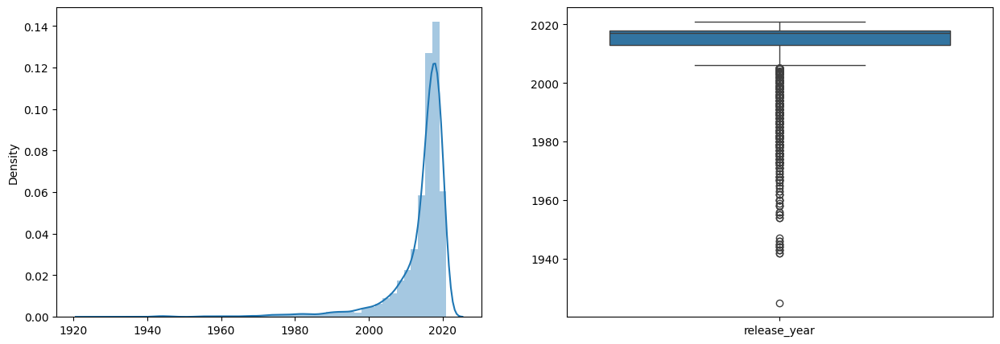

In [ ]:
# Handling Outliers & Outlier treatments

# plotting graph
fig,ax = plt.subplots(1,2, figsize=(15,5))

# Display boxplot and dist plot.
sns.distplot(x=df['release_year'], ax=ax[0])
sns.boxplot(data=df, ax=ax[1])

Except for the release year, almost all of the data are presented in text format.

The textual format contains the data we need to build a cluster/building model. Therefore, there is no need to handle outliers.

**Textual Data Preprocessing**

What is textual data preprocessing?

Textual data preprocessing is the process of preparing text data for analysis or modeling. It includes a series of steps that are applied to raw text data in order to clean, organize and standardize it so that it can be easily analyzed or used as input for natural language processing or machine learning models. The preprocessing steps typically include tokenization, stop-word removal, stemming or lemmatization, lowercasing, removing punctuation, and removing numbers. The goal of textual data preprocessing is to prepare the data for further analysis and modeling by removing irrelevant information and standardizing the format of the text. This can help improve the accuracy and effectiveness of the analysis or modeling.

**Modeling Approach**:

Choose the attributes that you want to cluster.

Text Preprocessing: Change all textual data to lowercase and eliminate all punctuation marks and stopwords. Removing commonly occurring words such as "the", "and", "a", etc. that don't carry much meaning.

Stemming or Lemmatization: Normalizing the words by reducing them to their base form.

Tokenization: Breaking the text into smaller units, such as sentences or words.

Dimensionality reduction.

Make use of various algorithms to cluster the movies and various techniques to determine the optimal number of clusters.

Build the optimal number of clusters and use wordclouds to display the contents of each cluster.

Selecting the required Attributes:

In [ ]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens


We will cluster the Netflix movies and TV shows into groups based on the following textual characteristics:

Director

Cast

Country

Rating

Listed_in (genres)

Description


In [ ]:
# creating tags column using all text column which one is used for model building purpose.
df['text_data'] = df['director'] + df['cast'] + df['country'] + \
                     df['rating'] + df['listed_in'] + df['description']

In [ ]:
df['text_data'][0]

' João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazilTV-MAInternational TV Shows, TV Dramas, TV Sci-Fi & FantasyIn a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

So, we have got all the essential information about a particular netflix TV show or Movie in one column,i.e.,text_data column.

**Removing Stop words and Lower Casing:**

In natural language processing (NLP) tasks, removing stop words and lowercasing words are common pre-processing steps.

Stop words Removal: Words such as "a," "an," "the," and "is," are words that are commonly used in a language but do not convey much meaning. These words can add noise to the data and can sometimes affect the performance of NLP models, so they are often removed as a pre-processing step.

Lowercasing: It is the process of converting all the words in a text to lowercase. This can be useful in tasks such as information retrieval or text classification where case differences are not important and also can reduce the size of the vocabulary making it easier to work with larger texts or texts in languages with a high number of inflected forms.

In [ ]:
import nltk
import numpy as np

# Download the 'stopwords' dataset
nltk.download('stopwords')

from nltk.corpus import stopwords
# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# applying stopwords function.
df['text_data'] = df['text_data'].apply(stopwords)

In [ ]:
# checking the first row again
df['text_data'][0]

'joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibraziltv-mainternational tv shows, tv dramas, tv sci-fi & fantasyin future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.'

We have successfully changed the df['text_data'] column's contents to lowercase and removed all stopwords.

**Removing Punctuations**:

Removing punctuation is the process of removing any punctuation marks (e.g., periods, commas, exclamation points, etc.) from text data. This is a common pre-processing step in natural language processing (NLP) tasks and text analysis, as punctuation marks often do not carry much meaning and can add noise to the data. Removing punctuation can also make it easier to tokenize text into words or sentences, as punctuation marks often act as delimiters between words or sentences. Additionally, removing punctuation can also help in reducing the size of the vocabulary, which can make it easier to work with larger texts or texts in languages with a high number of inflected forms. It can be done using python libraries such as string, re, and nltk.

In [ ]:
# function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# applying remove_punctuation function
df['text_data'] = df['text_data'].apply(remove_punctuation)

In [ ]:
# checking the first row after the process
df['text_data'][0]

'joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

We have effectively eliminate all the punctuation marks from the text_data column.

**Stemming**:

Stemming is the process of reducing a word to its base or root form. This is a common pre-processing step in natural language processing (NLP) tasks and text analysis. The goal of stemming is to reduce words to their base form so that words with the same stem are treated as the same word, even if they are written in different forms. For example, stemming would reduce "running," "runner," and "ran" to the base form "run." This can be useful in tasks such as information retrieval or text classification where the specific form of a word is not important, and it can also help in reducing the size of the vocabulary. There are several stemmers available in python such as Porter stemmer, Snowball stemmer and Lancaster stemmer.

We will utilize SnowballStemmer to construct a meaningful word from a word corpus.

In [ ]:
from nltk.stem.snowball import SnowballStemmer
# create an object of stemming function
stemmer = SnowballStemmer("english")

# define a function to apply stemming using SnowballStemmer
def stemming(text):
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [ ]:
# appying stemming function
df['text_data'] = df['text_data'].apply(stemming)

In [ ]:
df['text_data'][0]

'joão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmaintern tv show tv drama tv scifi fantasyin futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalor'

We have successfully utilized the stemming process.

**Text Vectorization**:

Text vectorization is the process of converting text data into numerical vectors or feature representations that can be used for machine learning or data analysis tasks. In simple terms, it transforms the text data into numerical data which can be easily processed by machine learning algorithms. There are several text vectorization techniques available such as bag of words, Tf-idf, Word2vec, and GloVe etc.

We will be using the TF-IDF vectorizer, which stands for Term Frequency Inverse Document Frequency
TF(t) = (Number of times term t appears in a document) / (Total number of terms in the document). The more often a word appears in a document, the higher its TF score.

IDF(t) = IDF measures how rare a word is across all the documents in the corpus. The rarer a word, the higher its IDF score.

The product of TF and IDF is used to calculate the overall weight of a word in a document, which is known as the TF-IDF score. Words with high TF-IDF scores are considered to be more important and relevant to the document than words with low TF-IDF scores.

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
# create the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 10000 to prevent system from crashing

# fit the vectorizer using the text data
tfidf.fit(df['text_data'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [ ]:
print(len(dictionary)) #number of independet features created from "text_data" columns

10000


In [ ]:
# convert vector into array form for clustering
vector = tfidf.transform(df['text_data']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


Normalizing numerical features:

In machine learning, data normalization is important because it:

Improves model performance: Normalized data helps models converge faster, make better predictions, and avoid the "NaN trap".

Enhances stability: Normalization helps models reach optimal solutions more efficiently.

Makes data easier to interpret: Normalized data is easier to understand and visualize, making it easier to identify relationships between features.

Prevents certain features from dominating: Normalization ensures that data lies within a certain range, so that no single feature has too much influence on the learning process.

In [ ]:
from sklearn.preprocessing import StandardScaler  # Import StandardScaler
scaler = StandardScaler()
df[['release_year', 'duration']] = scaler.fit_transform(df[['release_year', 'duration']])

**Dimensionality Reduction**:

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while retaining as much information as possible. The main goal of dimensionality reduction is to simplify the data while minimizing the loss of information. It is a crucial step in machine learning and data analysis as it can help to improve the performance of models, reduce overfitting, and make it easier to visualize and interpret the data.

There are several techniques used for dimensionality reduction, such as: Principal Component Analysis (PCA), Linear Discriminant Analysis (LDA), t-Distributed Stochastic Neighbor Embedding (t-SNE), Autoencoder, and Random Projection etc.

We will use **Principal Component Analysis (PCA)** to reduce the dimensionality of data.

In [ ]:
from sklearn.decomposition import PCA
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

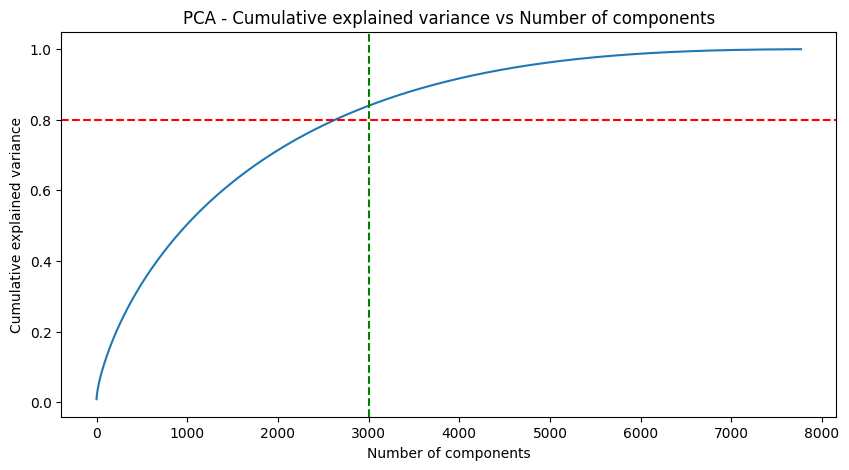

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

We discover that approximately 7500 components account for 100 percent of the variance.

3000 components alone account for more than 80% of the variance.

Therefore, we can take the top 3000 components to reduce dimensionality and simplify the model while still being able to capture more than 80% of the variance.

In [ ]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [ ]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7770, 3000)

## **Model Implementation**
**K-Means Clustering:**

K-means clustering is a popular unsupervised machine learning technique used to group similar data points together. The goal of k-means clustering is to partition a dataset into k clusters, where each cluster contains similar data points and is represented by its centroid.

The k-means algorithm works by first randomly selecting k centroids, one for each cluster. Then, it assigns each data point to the cluster whose centroid is closest to it. This process is repeated until the assignment of data points to clusters no longer changes, or until a maximum number of iterations is reached.

We will determine the best number of clusters for the K-means clustering algorithm by visualizing the elbow curve and silhouette score.

In [ ]:
# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

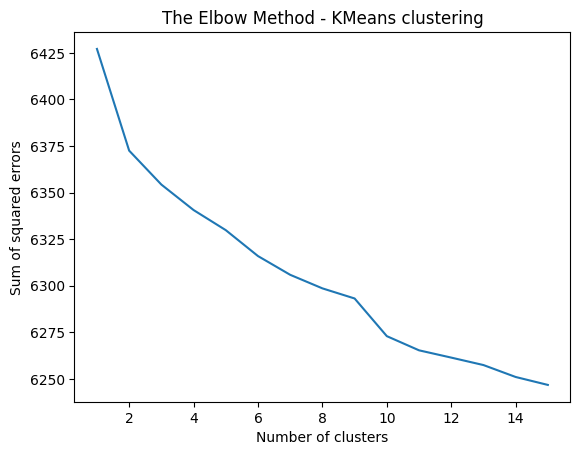

In [ ]:
'''Elbow method to find the optimal value of K'''

# Initialize a list to store the sum of squared errors for each value of K
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of K
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

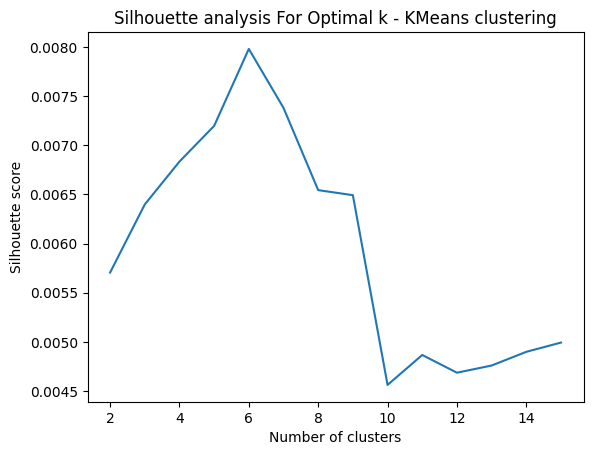

In [ ]:
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# Clustering the data into 6 clusters
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=6, random_state=33)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6319.500608975341, 0.0049320558145137545)


In [ ]:
# Adding a kmeans cluster number attribute
df['kmeans_cluster'] = kmeans.labels_

In [ ]:
df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
703,TV Show,BAKI,,"Nobunaga Shimazaki, Takayuki Sugo, Bin Shimada...",Japan,TV-MA,"Anime Series, International TV Shows",While martial arts champion Baki Hanma trains ...,5
7101,TV Show,Timmy Time,,"Kate Harbour, Justin Fletcher, Louis Jones",United Kingdom,TV-Y,"British TV Shows, Kids' TV",This delightful animated series centers on imp...,5
5355,TV Show,Sam & Cat,,"Jennette McCurdy, Ariana Grande, Cameron Ocasi...",United States,TV-PG,"Kids' TV, TV Comedies","To earn cash, roommates Sam and Cat start a ba...",2
41,Movie,Ég man þig,Óskar Thór Axelsson,"Jóhannes Haukur Jóhannesson, Ágústa Eva Erlend...",Iceland,TV-MA,"Horror Movies, International Movies","Young urbanites renovating a rundown house, an...",3
71,Movie,16 Blocks,Richard Donner,"Bruce Willis, Mos Def, David Morse, Jenna Ster...","United States, Germany",PG-13,Action & Adventure,Tasked with escorting a prosecution witness to...,5


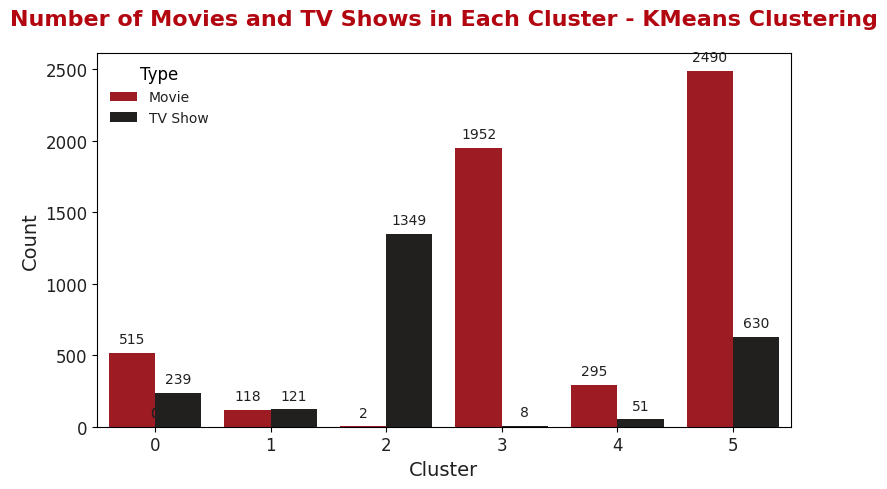

In [ ]:
# Netflix-inspired colors
netflix_red = "#b20710"
netflix_black = "#221f1f"
netflix_gray = "#f5f5f1"

# Plotting the bar chart
plt.figure(figsize=(8, 5))
graph = sns.countplot(x='kmeans_cluster', data=df, hue='type', palette=[netflix_red, netflix_black])
plt.title('Number of Movies and TV Shows in Each Cluster - KMeans Clustering', fontsize=16, fontweight='bold', color=netflix_red, pad=20)
plt.xlabel('Cluster', fontsize=14, color=netflix_black)
plt.ylabel('Count', fontsize=14, color=netflix_black)

# Adding value count on the top of the bars
for p in graph.patches:
    graph.annotate(format(p.get_height(), '.0f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 10), textcoords='offset points', color=netflix_black)

# Customizing ticks
plt.xticks(color=netflix_black, fontsize=12)
plt.yticks(color=netflix_black, fontsize=12)

# Styling the legend
plt.legend(title='Type', title_fontsize=12, fontsize=10, frameon=False, loc='upper left', facecolor='white', labelcolor=netflix_black)

# Set background colors
plt.gca().set_facecolor('white')
plt.gcf().patch.set_facecolor('white')

plt.tight_layout()
plt.show()


Successfully built 6 clusters using the k-means clustering algorithm

**Building wordclouds for different clusters in K-Means Clustering**

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Netflix-inspired colors
netflix_red = "#b20710"
netflix_black = "#221f1f"
netflix_gray = "#f5f5f1"

def kmeans_worldcloud(cluster_number, column_name):
    """
    Function for building a word cloud for the movies/shows in a given KMeans cluster.
    """
    df_wordcloud = df[['kmeans_cluster', column_name]].dropna()
    df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster'] == cluster_number]

    # Combine text documents
    text = " ".join(word for word in df_wordcloud[column_name])

    # Create the word cloud
    wordcloud = WordCloud(stopwords=set(STOPWORDS),
                          background_color=netflix_gray,
                          colormap='Reds', # Netflix red-based palette
                          contour_color=netflix_black,
                          contour_width=2).generate(text)

    # Plot the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.gcf().patch.set_facecolor(netflix_gray)  # Background of figure
    plt.show()


Now let's analyse wordcloud based on description column for each cluster

cluster 0


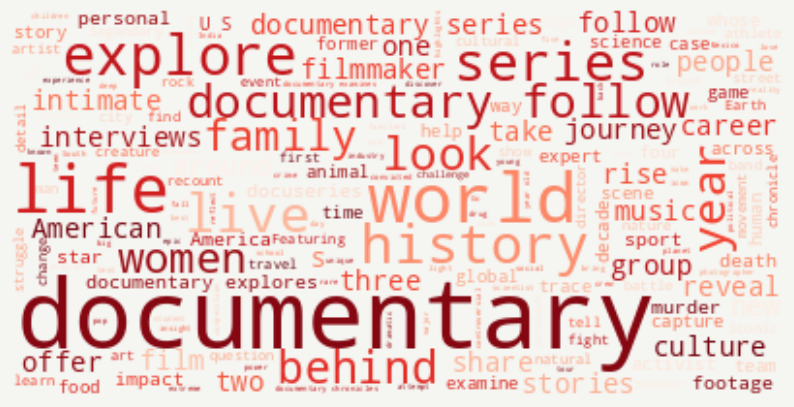

cluster 1


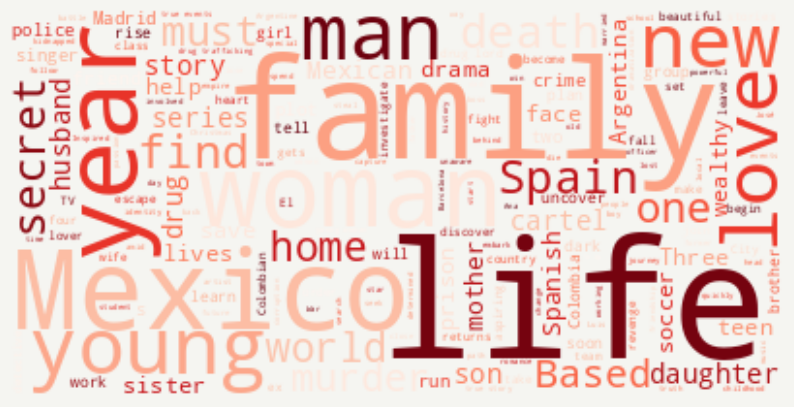

cluster 2


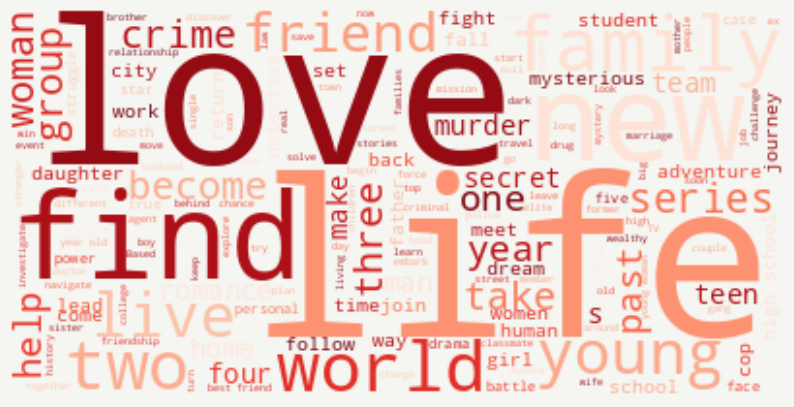

cluster 3


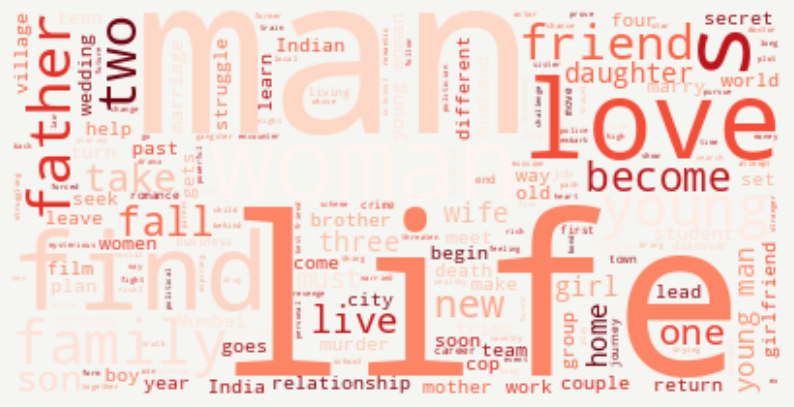

cluster 4


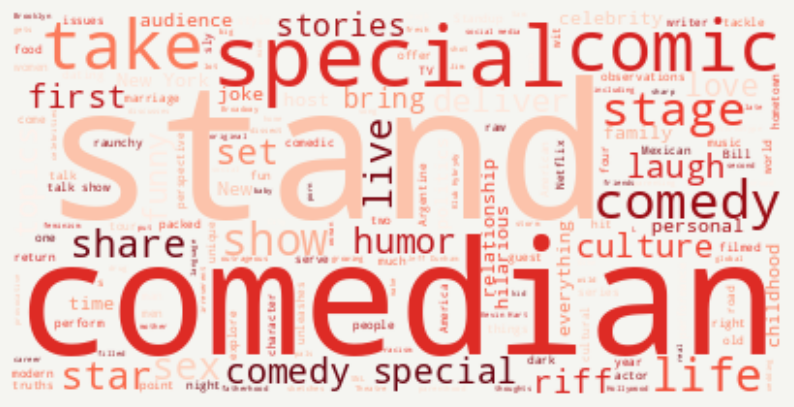

cluster 5


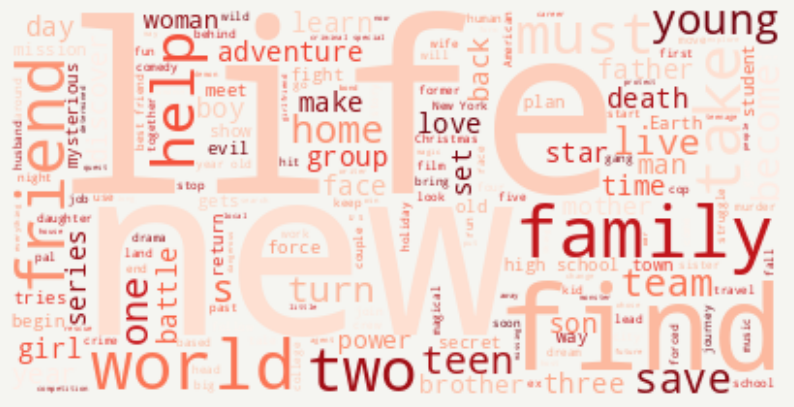

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

Now let's analyse wordcloud based on 'cast' column for each cluster

cluster 0


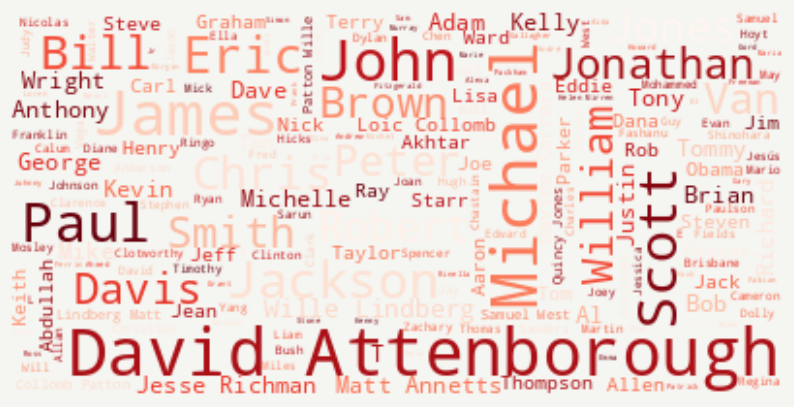

cluster 1


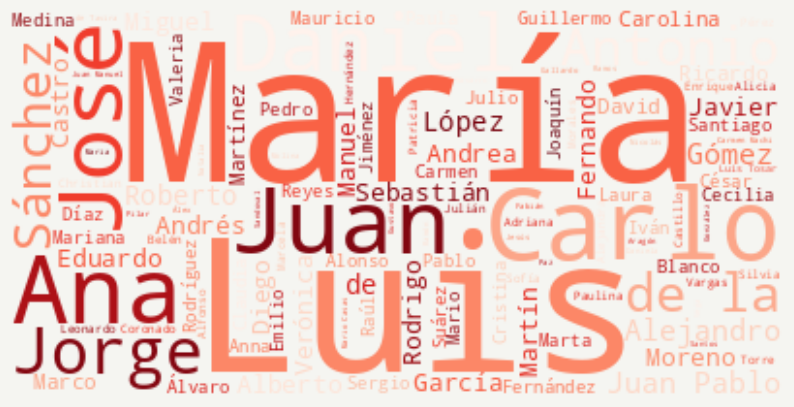

cluster 2


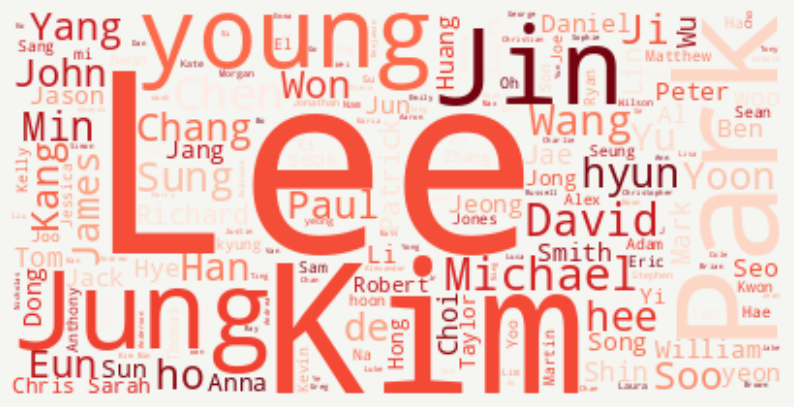

cluster 3


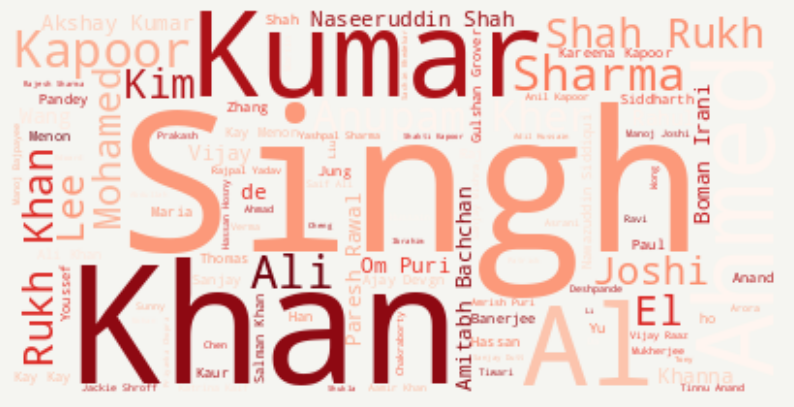

cluster 4


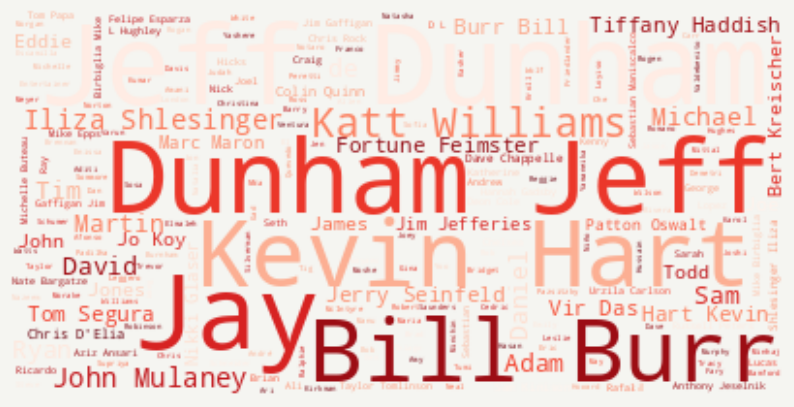

cluster 5


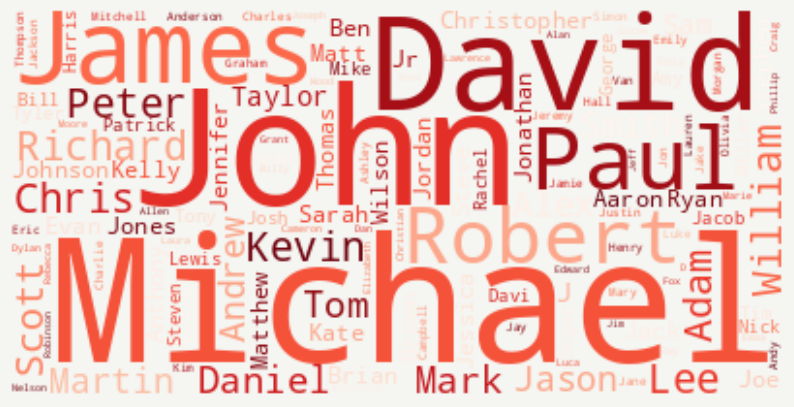

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

Word Cloud on "director" column for different cluster

cluster 0


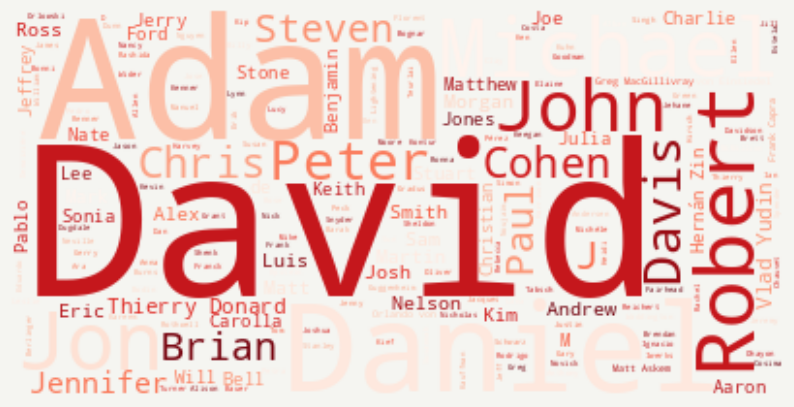

cluster 1


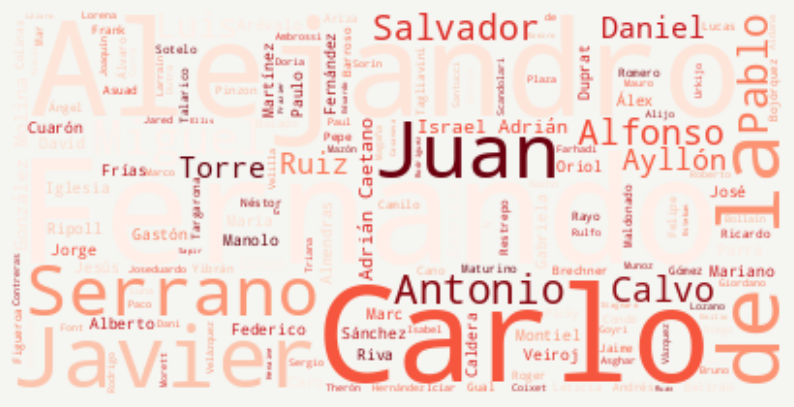

cluster 2


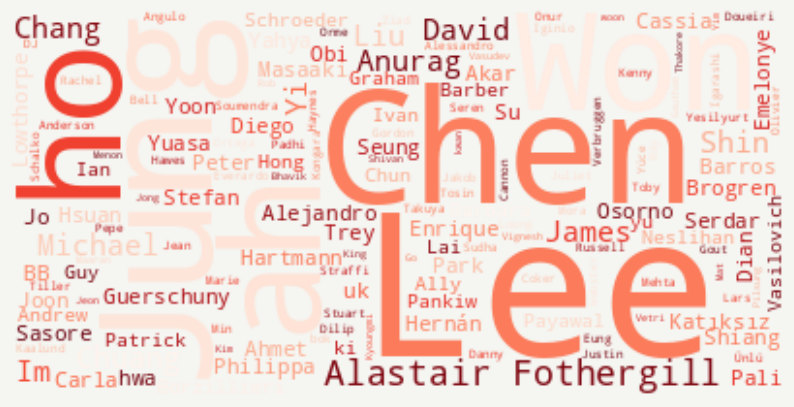

cluster 3


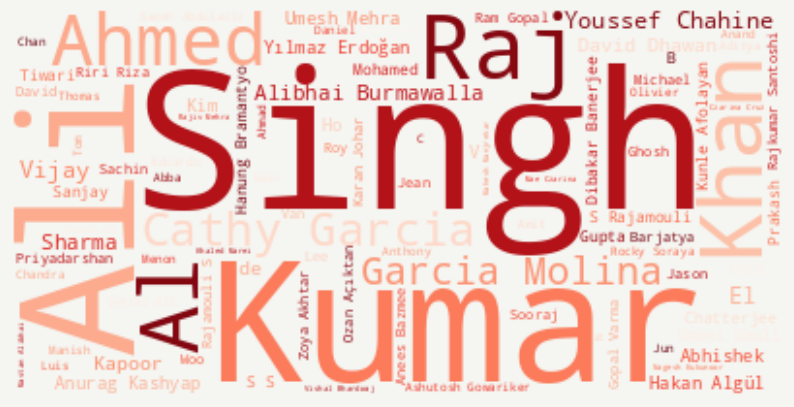

cluster 4


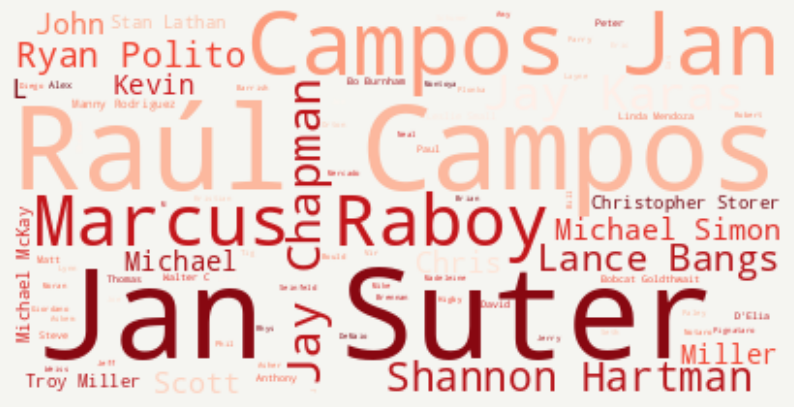

cluster 5


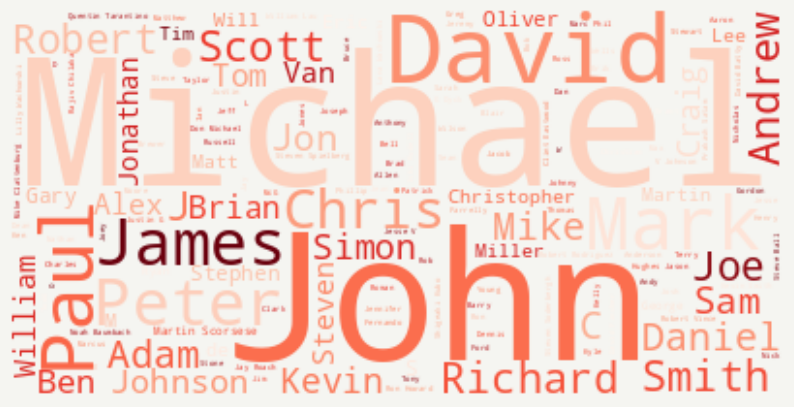

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

Word Cloud on "listed_in" (genre) col for different cluster

cluster 0


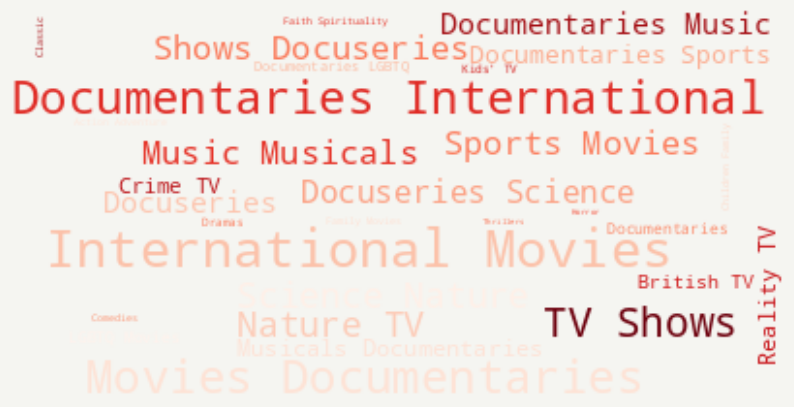

cluster 1


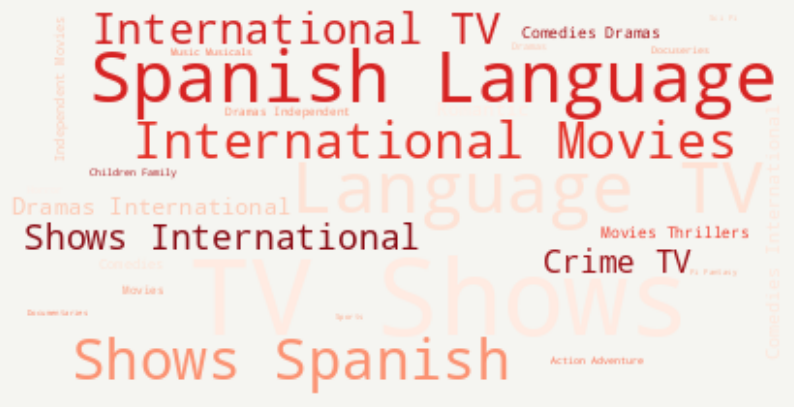

cluster 2


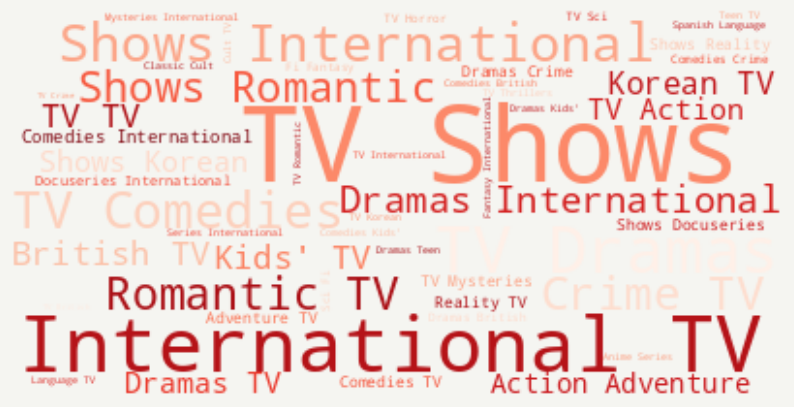

cluster 3


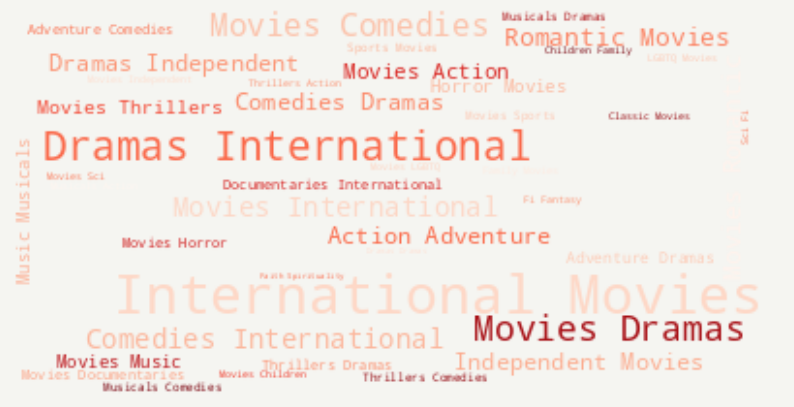

cluster 4


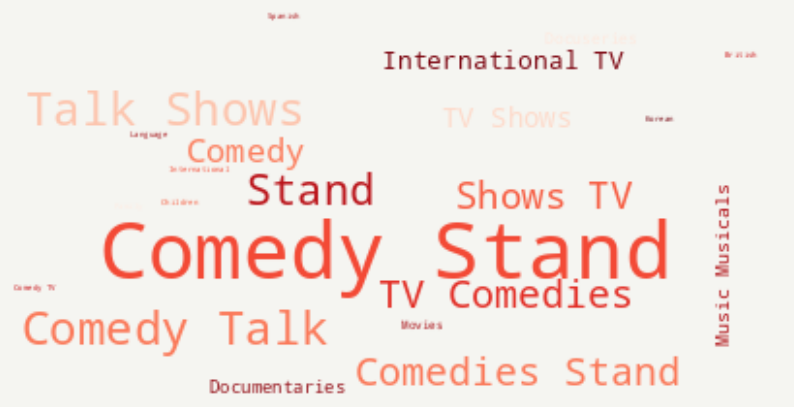

cluster 5


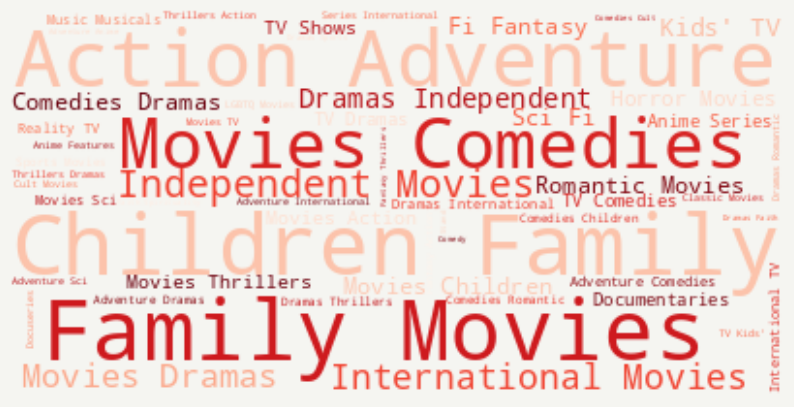

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

Word Cloud on "country" column column for different cluster

cluster 0


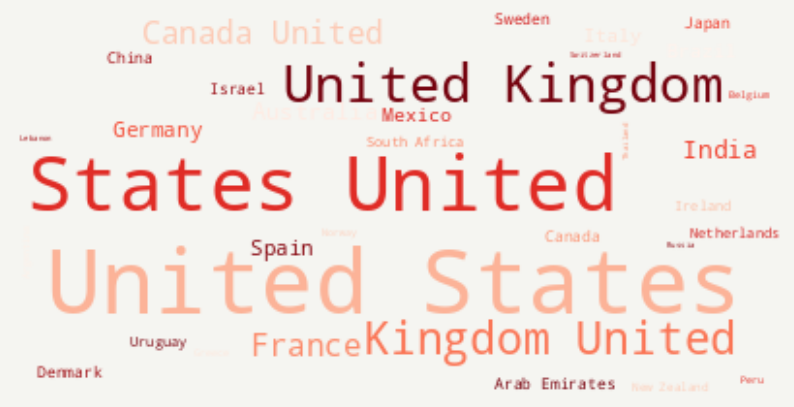

cluster 1


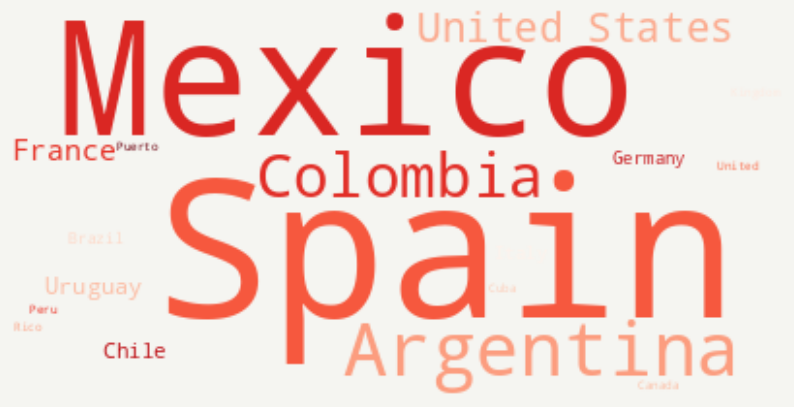

cluster 2


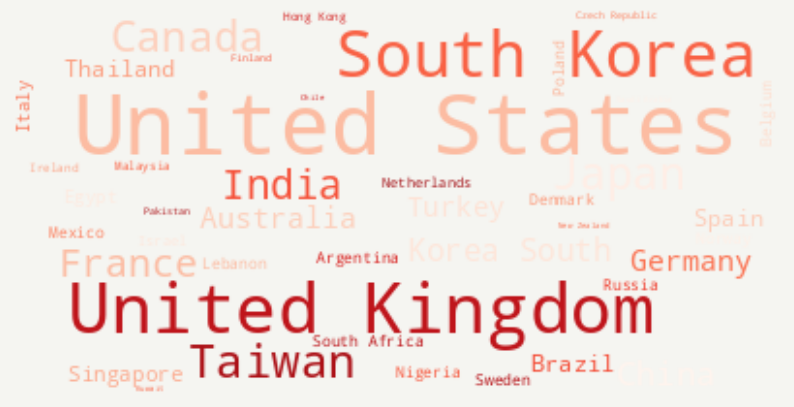

cluster 3


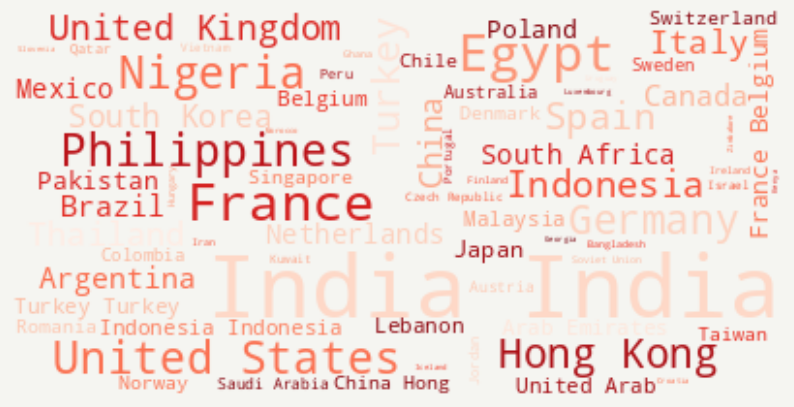

cluster 4


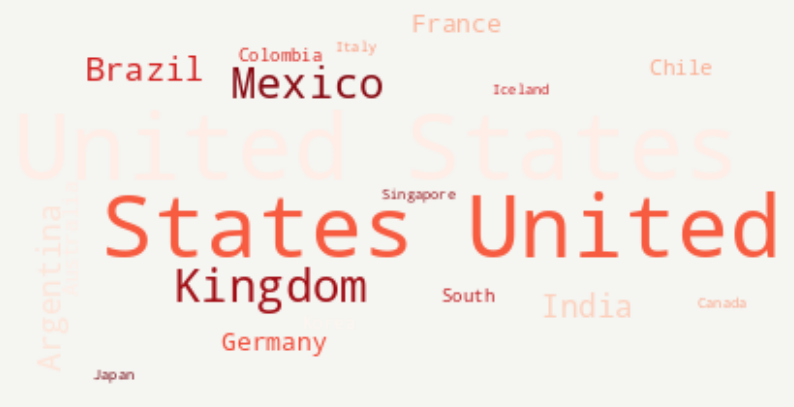

cluster 5


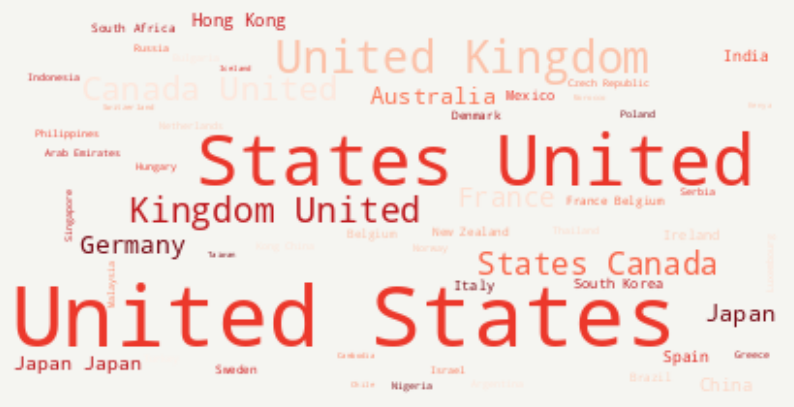

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

Word Cloud on "title" column column for different cluster

cluster 0


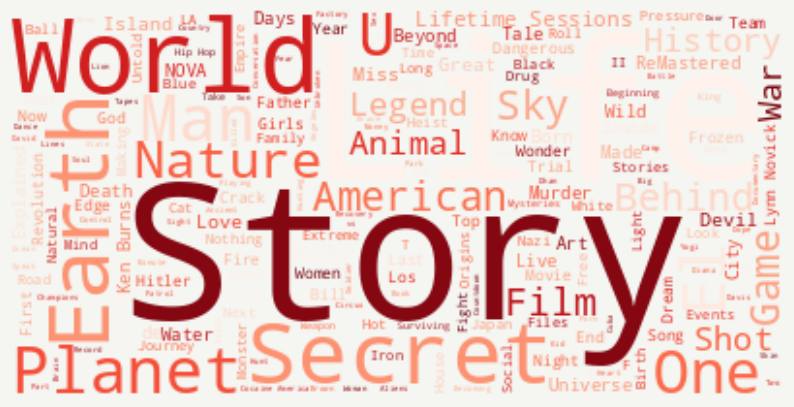

cluster 1


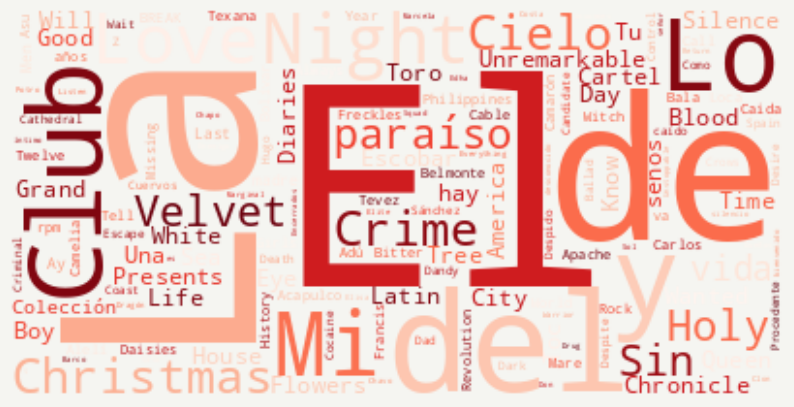

cluster 2


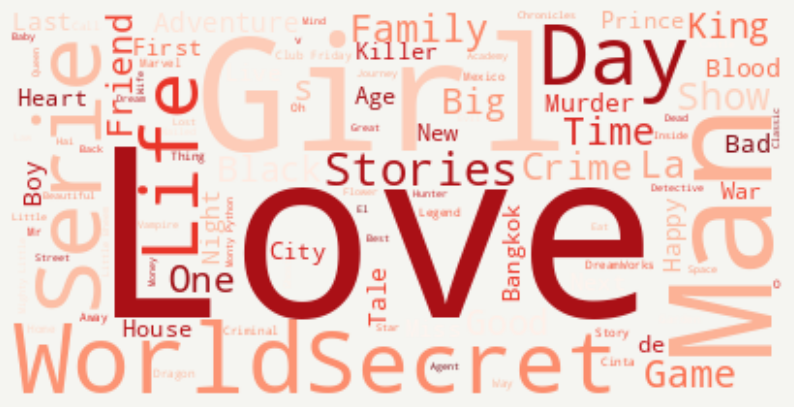

cluster 3


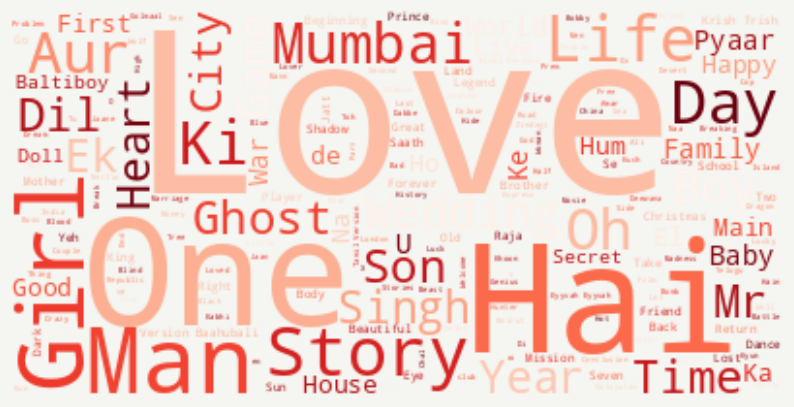

cluster 4


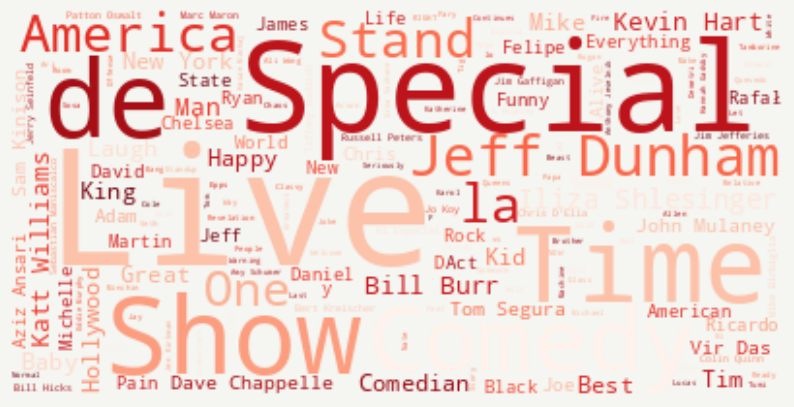

cluster 5


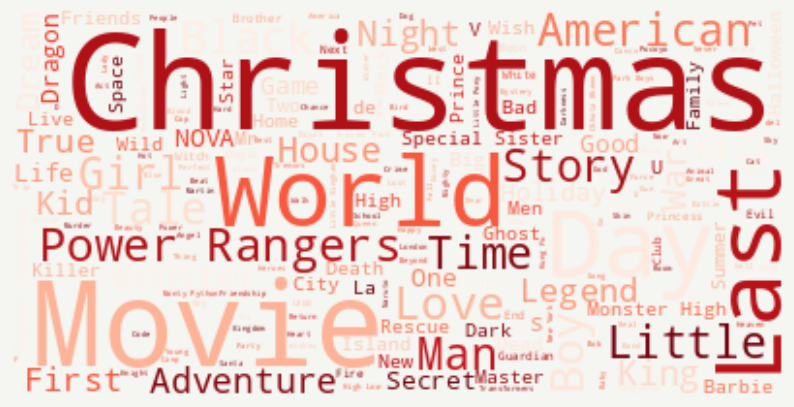

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

**Hierarchical clustering:**

Hierarchical clustering is a method of clustering data points into a tree-like structure. It is an alternative method to k-means clustering and it is used to group similar data points together in a hierarchical fashion.

There are two main types of Hierarchical clustering: Agglomerative and Divisive. Agglomerative is a bottom-up approach where each data point is considered as a separate cluster and the algorithm iteratively merges the closest clusters. On the other hand, Divisive is a top-down approach where all data points are considered as a single cluster and the algorithm iteratively splits the clusters.

The hierarchical clustering algorithm can be represented by a dendrogram which makes it easy to visualize the structure of the clusters.

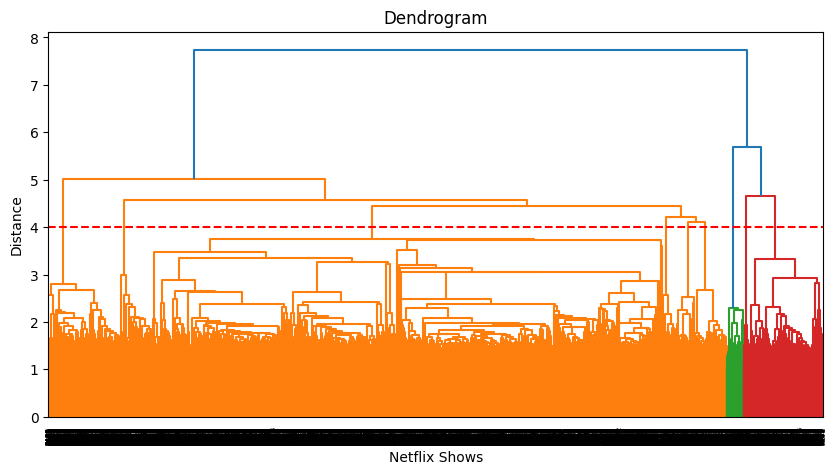

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 5))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

**Inference from the dendogram**:

**At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm.**

Building 7 clusters using the Agglomerative clustering algorithm.

array([1, 0, 2, ..., 2, 1, 2])

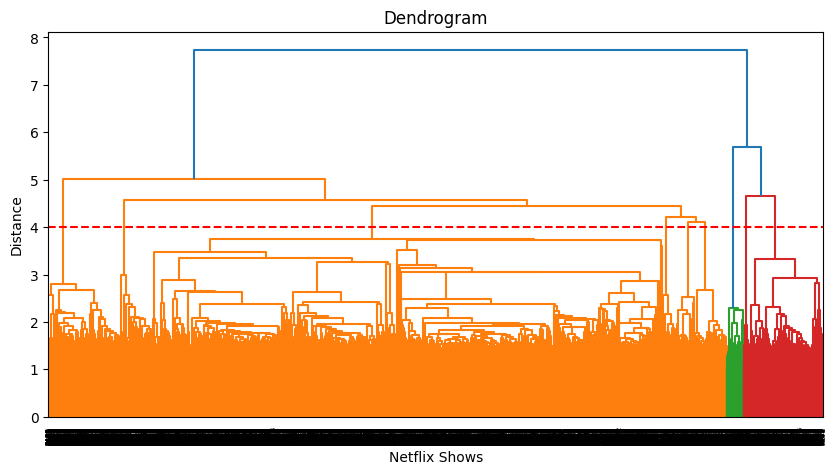

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 5))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, linkage='ward')
hierarchical.fit_predict(X)

In [ ]:
# Adding a hierarchical cluster number attribute
df['hierarchical_cluster'] = hierarchical.labels_

In [ ]:
df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]


,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
5895,Movie,Super Monsters Furever Friends,,"Elyse Maloway, Vincent Tong, Erin Mathews, And...",,TV-Y,Children & Family Movies,"On the first night of spring, the Super Monste...",2
2549,Movie,Guilty,Ruchi Narain,"Kiara Advani, Akansha Ranjan Kapoor, Gurfateh ...",India,TV-MA,"Dramas, International Movies",When a college heartthrob is accused of rape b...,3
5211,Movie,Ringan,Makarand Mane,"Shashank Shende, Sahil Joshi, Suhas Sirsat, Ka...",India,TV-14,"Dramas, International Movies","Desperate to save his land, an indebted farmer...",3
7517,Movie,Wedding Unplanned,Reem Kherici,"Reem Kherici, Nicolas Duvauchelle, Julia Piato...",France,TV-MA,"Comedies, International Movies, Romantic Movies",Mathias's girlfriend finds a business card for...,2
3148,Movie,Jenny Slate: Stage Fright,Gillian Robespierre,Jenny Slate,United States,TV-MA,"Documentaries, Stand-Up Comedy",Jenny Slate's first stand-up special is a mix ...,6


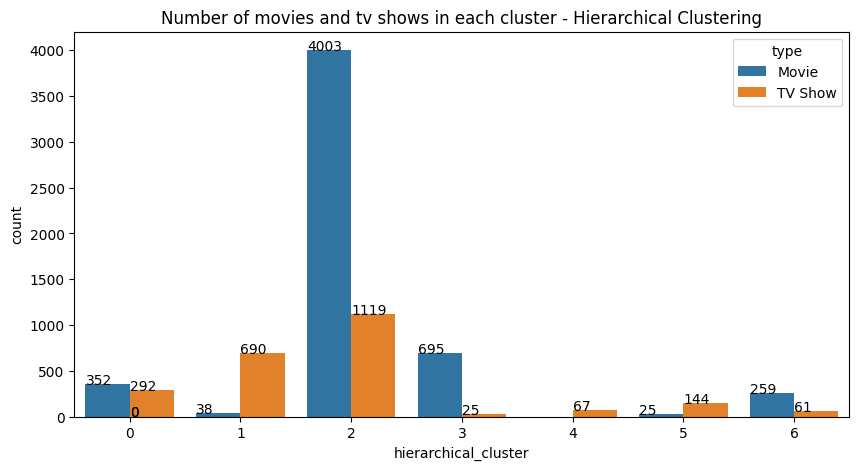

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=df, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 7 clusters using the Agglomerative (hierarchical) clustering algorithm.

**Building wordclouds for different clusters in hierarchical Clustering**

In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = df[['hierarchical_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Word Cloud on "title" column for different cluster

cluster 0


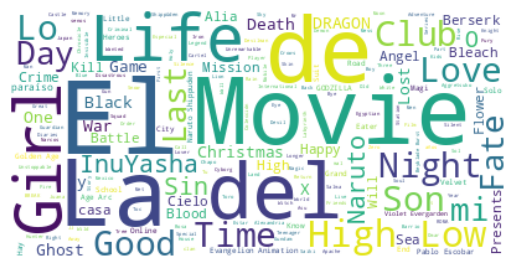

cluster 1


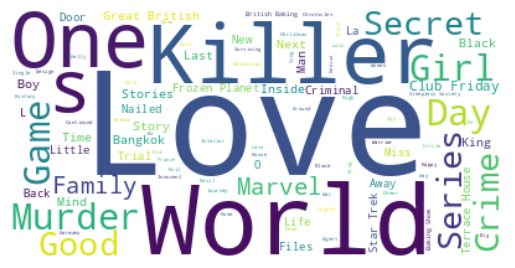

cluster 2


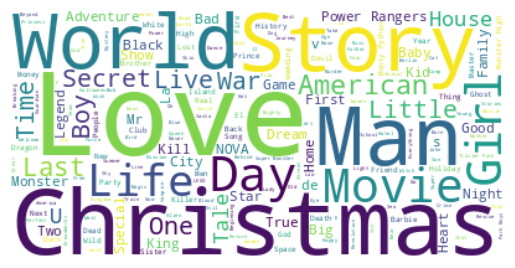

cluster 3


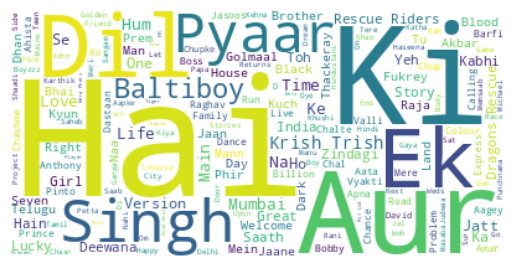

cluster 4


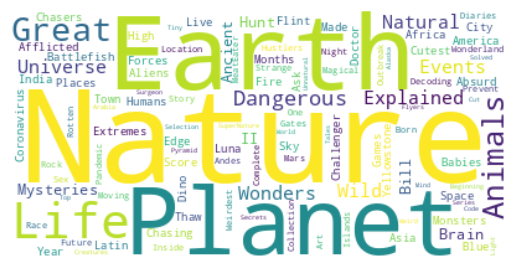

cluster 5


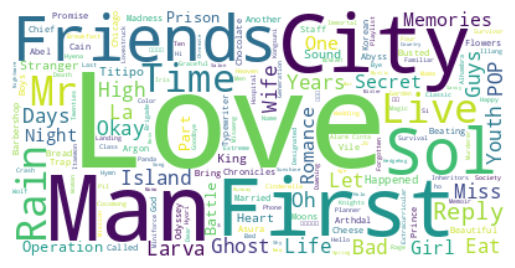

cluster 6


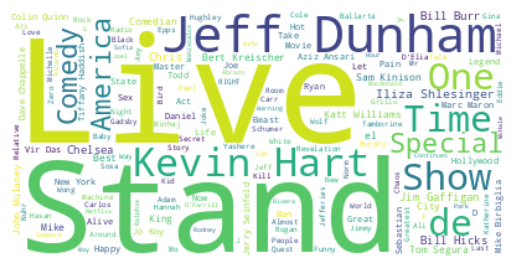

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

Word Cloud on "description" column for different cluster

cluster 0


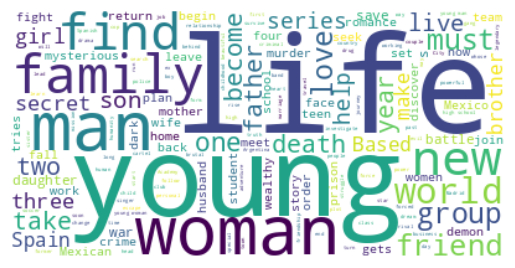

cluster 1


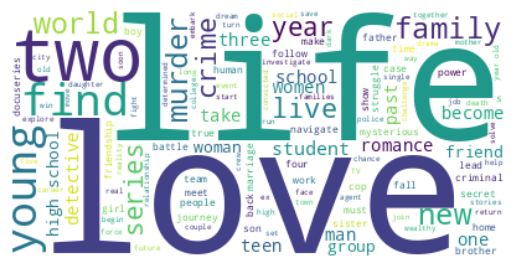

cluster 2


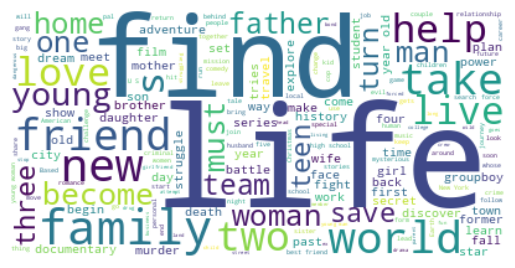

cluster 3


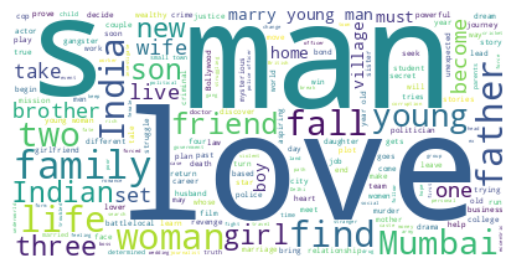

cluster 4


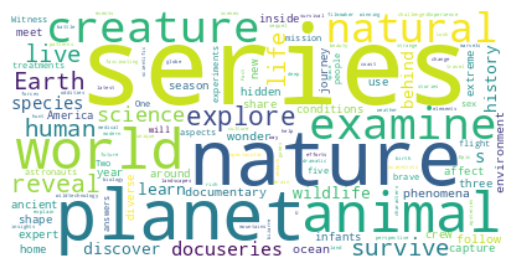

cluster 5


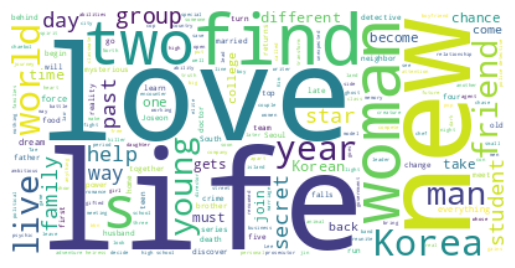

cluster 6


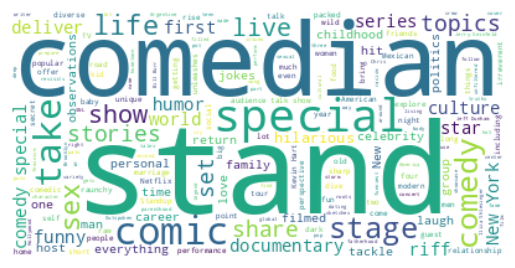

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

Word Cloud on "cast" column for different cluster

cluster 0


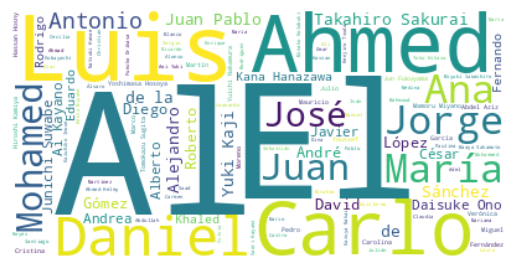

cluster 1


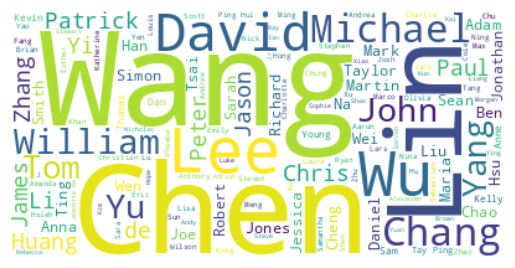

cluster 2


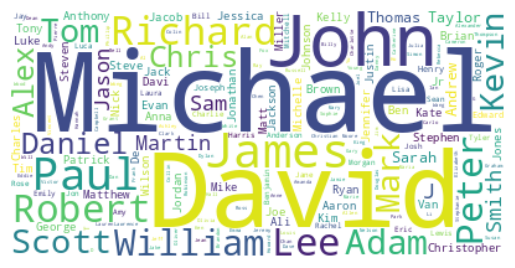

cluster 3


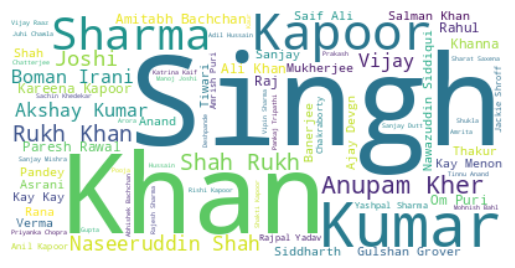

cluster 4


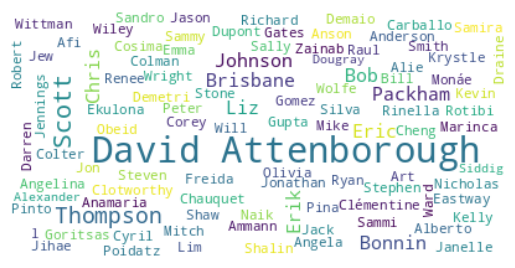

cluster 5


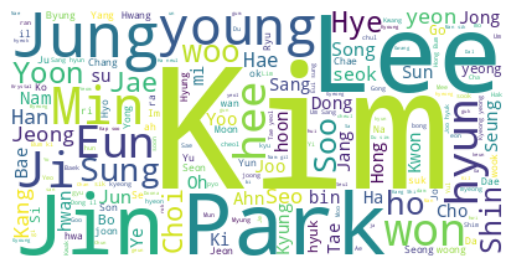

cluster 6


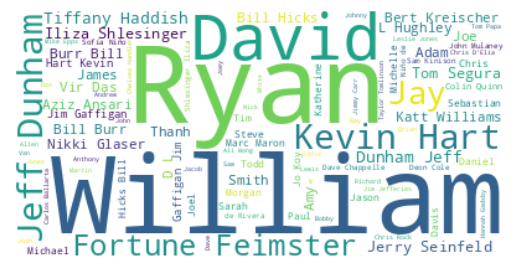

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

Word Cloud on "country" column for different cluster

cluster 0


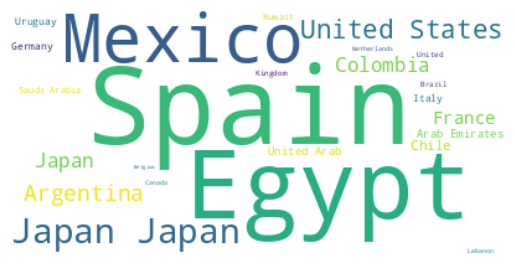

cluster 1


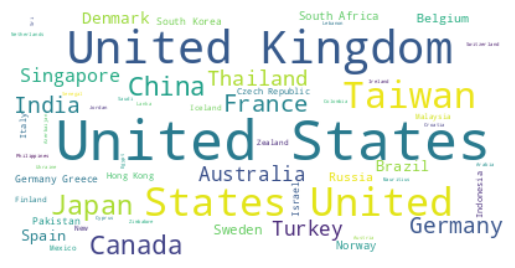

cluster 2


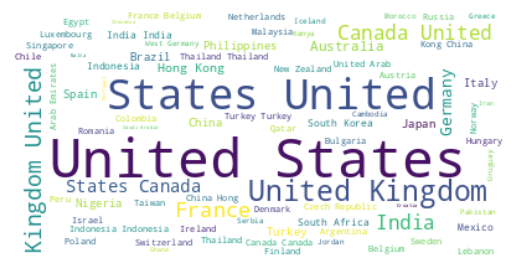

cluster 3


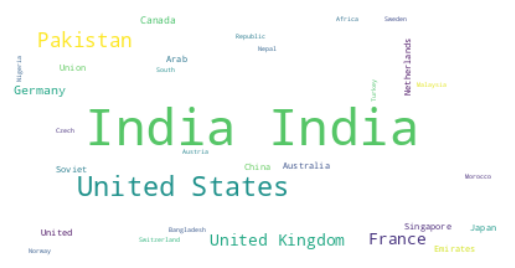

cluster 4


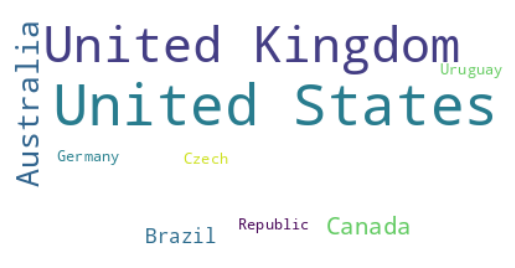

cluster 5


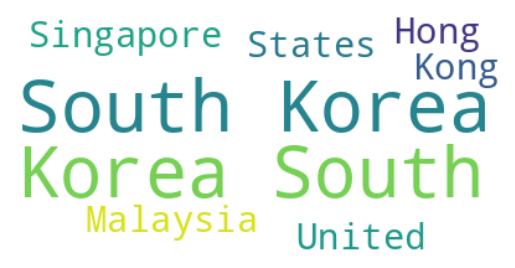

cluster 6


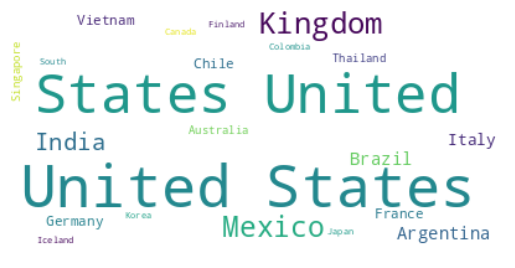

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

Word Cloud on "listed_in (genre)" column for different cluster

cluster 0


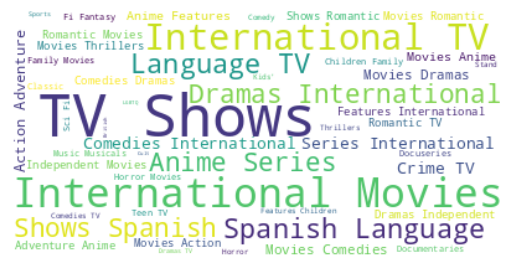

cluster 1


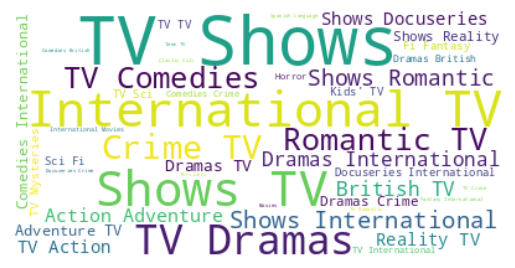

cluster 2


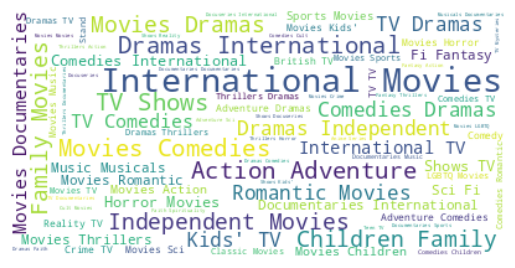

cluster 3


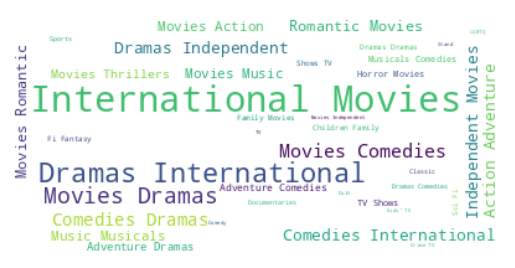

cluster 4


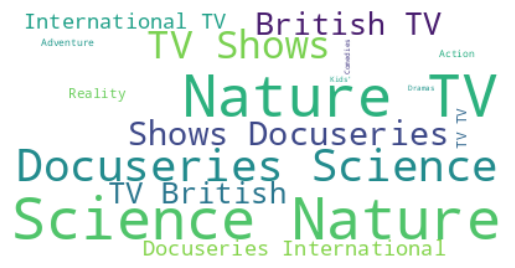

cluster 5


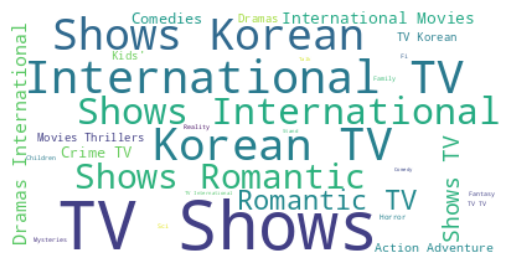

cluster 6


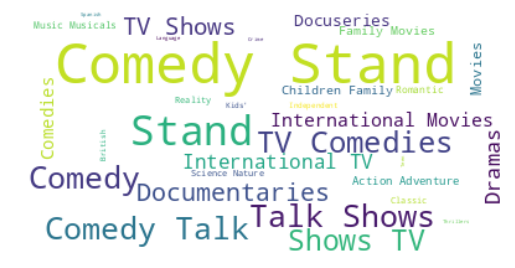

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

# **Recommendation System**
A content-based recommendation system is a type of recommendation system that suggests items to users based on their similarity to other items that the user has shown interest in. It uses the attributes or features of the items to determine the similarity between them.

Based on how similar the movies and shows are, we can create a straightforward content-based recommender system.
The recommender system needs to be able to suggest a list of similar shows that a person who has watched a show on Netflix likes.
We can use cosine similarity to determine the shows' similarity scores.
By dividing the dot product of the two vectors by their magnitude values, the similarity between A and B can be calculated. Simply put, the angle between two vectors decreases as the cosine similarity score increases.



In [ ]:
# veryfying index
df[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel graudemián bichir héctor bonilla o...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7782,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7783,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7784,s7785,Zulu Man in Japan,nasti c tvmadocumentari intern movi music musi...
7785,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


Our dataframe has a total of 7770 rows, as shown above, and the last index is 7786 due to the deletion of some rows while treating null values.

In order to construct a content-based recommendation system, we determine the similarity score based on a specific index_id for that particular "tags" column.

If we are unable to reset the index, there is a good chance that instead of providing an index, we will calculate cosine similarity for another index. in order to avoid this issue and properly address index when developing the recommendation system. The index was simply reset.

In [ ]:
# defining new dataframe for building recommandation system
recommender_df = df.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly
recommender_df[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel graudemián bichir héctor bonilla o...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7765,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7766,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7767,s7785,Zulu Man in Japan,nasti c tvmadocumentari intern movi music musi...
7768,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


As shown in the dataframe above, the index was successfully reset. The dataset can now be used to construct a content-based recommendation system.

In [ ]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [ ]:
print(f"before reset index id for movie 'Zero' : {df[df['title'] == 'Zozo'].index[0]}")
print(f"after reset index id for movie 'Zero': {recommender_df[recommender_df['title'] == 'Zozo'].index[0]}")

before reset index id for movie 'Zero' : 7782
after reset index id for movie 'Zero': 7765


In [ ]:
# calling out transformed array independent features created from text_data(cluster) column after performing PCA for dimensionality reduction.
X

array([[ 1.59793139e-01, -8.53992628e-03, -5.55391070e-03, ...,
         1.14363002e-02, -1.22604693e-02, -5.60151186e-03],
       [-4.13081153e-02,  1.72476920e-02, -1.66261861e-02, ...,
        -1.48218811e-03,  9.16538256e-04, -1.37716848e-02],
       [-4.11128084e-02,  3.21271439e-02,  5.44475869e-02, ...,
         9.90677115e-03,  1.64987847e-02,  2.38066772e-03],
       ...,
       [-6.61635132e-02,  3.45251086e-03, -7.51697211e-02, ...,
        -1.79289909e-03, -1.49988702e-02, -1.20735636e-02],
       [ 5.44946481e-02, -3.25189084e-02, -3.18956106e-02, ...,
         8.81504519e-03, -2.08832559e-03,  2.79605020e-03],
       [-7.29301282e-02, -1.48837000e-01, -1.58585384e-01, ...,
         2.29135684e-03, -5.29703587e-03,  1.40128049e-04]])

Calculating Cosine Similarity

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.08021778,  0.01977675, ..., -0.02173105,
         0.0013999 , -0.01763917],
       [ 0.08021778,  1.        , -0.00494593, ...,  0.06009322,
        -0.01008   , -0.01103258],
       [ 0.01977675, -0.00494593,  1.        , ..., -0.00527496,
        -0.00972708, -0.01690256],
       ...,
       [-0.02173105,  0.06009322, -0.00527496, ...,  1.        ,
        -0.00451774,  0.11858882],
       [ 0.0013999 , -0.01008   , -0.00972708, ..., -0.00451774,
         1.        ,  0.03724866],
       [-0.01763917, -0.01103258, -0.01690256, ...,  0.11858882,
         0.03724866,  1.        ]])

creating a function that lists down top ten movies on the basis of similarity score for that particular movie:

In [ ]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that particular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(df.iloc[i[0]].title)

In [ ]:
recommend('Golmaal: Fun Unlimited')

If you liked 'Golmaal: Fun Unlimited', you may also enjoy: 

Golmaal Returns
Maine Pyaar Kyun Kiya
Hattrick
Phir Hera Pheri
Ishqiya
C Kkompany
Himmatwala
Haseena Maan Jaayegi
Saheb Bibi Golaam
Kyaa Kool Hain Hum 3


In [ ]:
recommend('Breaking Bad')

If you liked 'Breaking Bad', you may also enjoy: 

Better Call Saul
Hormones
Servant of the People
My Life My Story
MINDHUNTER
Killer Inside: The Mind of Aaron Hernandez
W/ Bob & David
Time Share
The School Nurse Files
The Underclass


In [ ]:
recommend('Stranger Things')

If you liked 'Stranger Things', you may also enjoy: 

Beyond Stranger Things
Sleepless Society: Nyctophobia
Reckoning
Anjaan: Special Crimes Unit
Kiss Me First
The OA
American Odyssey
The Umbrella Academy
The 4400
The Darkness


In [ ]:
recommend('Peaky Blinders')

If you liked 'Peaky Blinders', you may also enjoy: 

Rebellion
Inception
Happy Valley
Caught on Camera
The Murder Detectives
Jonathan Strange & Mr Norrell
Inside the World’s Toughest Prisons
I AM A KILLER
The Frankenstein Chronicles
The Fear


In [ ]:
recommend('Lucifer')

If you liked 'Lucifer', you may also enjoy: 

The Good Cop
The Lizzie Borden Chronicles
On My Block
Rica, Famosa, Latina
Cold Case Files
Tom Segura: Completely Normal
Monty Python's Fliegender Zirkus
Sister Cities
Once in a Lifetime Sessions with Kasabian
Shooter


# **Conclusion**
In this project, we tackled a **text clustering problem** in which we had to categorize and group Netflix shows into **specific clusters** in such a way that shows in the same cluster are similar to one another and shows in different clusters are not.

There were **approximately 7787 records and 11 attributes** in the dataset.
We started by **working on the missing values** in the dataset and conducting **exploratory data analysis (EDA)**.

It was discovered that Netflix hosts more movies than television shows on its platform, and the total number of shows added to Netflix is expanding at an exponential rate. Additionally, most of the shows were made in the United States.

The **attributes were chosen** as the basis for the clustering of the data: **cast, country, genre, director, rating, and description.**
The **TF-IDF vectorizer** was used to tokenize, preprocess, and vectorize the values in these attributes.**10000 attributes in total** were created by TFIDF vectorization.
The problem of dimensionality was dealt with through the use of **Principal Component Analysis (PCA)**. Because 3000 components were able to account for more than 80% of the variance, **the total number of components was limited to 3000**.

Utilizing the **K-Means Clustering algorithm**, we first constructed clusters, and the **optimal number of clusters was determined to be 6**. The elbow method and Silhouette score analysis were used to get this.

The **Agglomerative clustering** algorithm was then used to create clusters, and the **optimal number of clusters was determined to be 7**. This was obtained after visualizing the dendrogram.

T**he similarity matrix generated by applying cosine similarity** was used to construct a **content-based recommender system**. The user will receive **ten recommendations** from this recommender system based on the type of show they watched.